# Data preparetion

### Import

In [1]:
#Load the required libraries
import warnings
warnings.filterwarnings('ignore')

import pandas as pd
import numpy as np
import seaborn as sns

import matplotlib.pyplot as plt
import sklearn.model_selection as ms
from sklearn.svm import SVR
from sklearn.model_selection  import train_test_split
from sklearn.preprocessing import OneHotEncoder,StandardScaler
from pandas.plotting import scatter_matrix
from sklearn.metrics import mean_squared_error
from math import sqrt

## Confusion Matrix
from sklearn.metrics import confusion_matrix
from sklearn.metrics import precision_recall_fscore_support, classification_report
from sklearn.metrics import accuracy_score,f1_score,roc_auc_score, recall_score
from sklearn.model_selection import cross_val_score, KFold, cross_val_predict
from sklearn.metrics import precision_recall_curve, average_precision_score,roc_curve, auc, precision_score

In [2]:
# feature selection
import statsmodels.api as sm
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from sklearn.metrics import mean_squared_error
from sklearn.model_selection import train_test_split
from sklearn.inspection import permutation_importance
import shap
import category_encoders as ce

import xgboost as xgb

In [3]:
## roc & auc
import numpy as np
import matplotlib.pyplot as plt
from sklearn import svm, datasets
from sklearn.metrics import roc_curve, auc  ###计算roc和auc

In [4]:
# Tree View
from sklearn.tree import plot_tree
import matplotlib.pyplot as plt

In [5]:
## modelling
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier

In [6]:
## GridSearch
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import RandomizedSearchCV

In [7]:
## Model Explaination
### Permutation Importance
import eli5
from eli5.sklearn import PermutationImportance
### SHAP
import shap

In [10]:
import os
os.getcwd()

'/Users/lijiaze/Desktop/2022-2/CITS5553/model/data'

In [9]:
os.chdir('/Users/lijiaze/Desktop/2022-2/CITS5553/model/data/')

### Load data

#### load whole data

In [11]:
#Load the data
df = pd.read_csv("wba_data_CLEAN.csv")

#View the data
df.head()

,Unnamed: 0,Subject,Gender,AgeY,ECV,TPP,SC,TympType,OAE1,OAE1.4,...,f(6168.8433),f(6349.6042),f(6535.6618),f(6727.1713),f(6924.2925),f(7127.1897),f(7336.0323),f(7550.9945),f(7772.2555),f(8000.0000)
0,0,8,0,9.333333,1.08,-189.0,0.52,1,3.0,10.0,...,0.5370,0.4869,0.4301,0.4080,0.3804,0.3291,0.2951,0.2530,0.2282,0.2003
1,1,22,0,9.500000,1.28,-49.0,1.28,0,7.0,4.0,...,0.2636,0.2578,0.2443,0.2549,0.2604,0.2397,0.2299,0.2048,0.1917,0.1659
2,2,24,1,9.833333,1.26,-27.0,0.87,0,9.0,12.0,...,0.4269,0.4142,0.3910,0.3799,0.3740,0.3536,0.3473,0.3237,0.3056,0.2881
3,3,31,0,9.916667,0.64,-8.0,0.60,0,13.0,9.0,...,0.0077,0.0123,0.0066,0.0000,0.0126,0.0231,0.0405,0.0401,0.0391,0.0258
4,4,42,0,7.916667,0.92,-17.0,1.65,0,7.0,0.0,...,0.2332,0.2216,0.2228,0.2653,0.2596,0.2576,0.2838,0.3598,0.3953,0.3642


In [12]:
# Remove 'Unnamed: 0' and subject column
wba_data = df.drop(["Unnamed: 0", "Subject"], axis=1)

wba_data.head()

,Gender,AgeY,ECV,TPP,SC,TympType,OAE1,OAE1.4,OAE2,OAE2.8,...,f(6168.8433),f(6349.6042),f(6535.6618),f(6727.1713),f(6924.2925),f(7127.1897),f(7336.0323),f(7550.9945),f(7772.2555),f(8000.0000)
0,0,9.333333,1.08,-189.0,0.52,1,3.0,10.0,18.0,14.0,...,0.5370,0.4869,0.4301,0.4080,0.3804,0.3291,0.2951,0.2530,0.2282,0.2003
1,0,9.500000,1.28,-49.0,1.28,0,7.0,4.0,9.0,5.0,...,0.2636,0.2578,0.2443,0.2549,0.2604,0.2397,0.2299,0.2048,0.1917,0.1659
2,1,9.833333,1.26,-27.0,0.87,0,9.0,12.0,8.0,12.0,...,0.4269,0.4142,0.3910,0.3799,0.3740,0.3536,0.3473,0.3237,0.3056,0.2881
3,0,9.916667,0.64,-8.0,0.60,0,13.0,9.0,13.0,11.0,...,0.0077,0.0123,0.0066,0.0000,0.0126,0.0231,0.0405,0.0401,0.0391,0.0258
4,0,7.916667,0.92,-17.0,1.65,0,7.0,0.0,2.0,12.0,...,0.2332,0.2216,0.2228,0.2653,0.2596,0.2576,0.2838,0.3598,0.3953,0.3642


In [13]:
# freqs = [f for f in features if f[:2] == "f("]
frequency = wba_data.iloc[:,14:138]
frequency_list = list(frequency.columns)
frequency_list[0:10]

['f(226.0000)',
 'f(257.3256)',
 'f(280.6155)',
 'f(297.3018)',
 'f(324.2099)',
 'f(343.4884)',
 'f(363.9133)',
 'f(385.5527)',
 'f(408.4789)',
 'f(432.7683)']

#### load original train and test data

In [19]:
#Load the data
X_train = pd.read_csv("X_train.csv")
X_test = pd.read_csv("X_test.csv")
y_train = pd.read_csv("y_train.csv")
y_test = pd.read_csv("y_test.csv")

#View the data
X_train.head()

,Gender,AgeY,ECV,TPP,SC,TympType,OAE1,OAE1.4,OAE2,OAE2.8,...,f(6168.8433),f(6349.6042),f(6535.6618),f(6727.1713),f(6924.2925),f(7127.1897),f(7336.0323),f(7550.9945),f(7772.2555),f(8000.0000)
0,1,8.583333,0.89,-151.0,2.53,1,0.0,5.0,9.2,11.7,...,0.3955,0.3583,0.2997,0.2709,0.2544,0.1956,0.1648,0.1158,0.1083,0.0542
1,1,9.833333,0.81,-63.0,1.32,0,8.1,20.8,14.7,6.9,...,0.4592,0.4006,0.3508,0.3381,0.2983,0.2789,0.2655,0.3118,0.3039,0.3022
2,0,10.083333,1.50,-28.0,0.56,0,10.4,15.4,15.6,9.9,...,0.2600,0.2409,0.2002,0.2064,0.2190,0.1961,0.2076,0.1994,0.2084,0.1099
3,1,8.666667,1.15,3.0,1.07,0,10.6,15.1,15.0,7.8,...,0.5128,0.4605,0.4126,0.4001,0.3634,0.3378,0.3084,0.3156,0.3042,0.2912
4,1,8.583333,1.03,-10.0,0.43,0,3.7,11.5,7.4,5.7,...,0.0000,0.0034,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000


#### load train and test sets for testing generative data

In [20]:
#Load the data
X_train_gen = pd.read_csv("X_gen_train.csv", usecols = X_train.columns)
X_test_gen = pd.read_csv("X_gen_test.csv", usecols = X_test.columns)
y_train_gen = pd.read_csv("y_gen_train.csv")
y_test_gen = pd.read_csv("y_gen_test.csv")

#View the data
X_train_gen.head()

,AgeY,TPP,OAE1,OAE1.4,OAE2,OAE2.8,OAE4,Pressure,SC,ECV,...,f(6168.8433),f(6349.6042),f(6535.6618),f(6727.1713),f(6924.2925),f(7127.1897),f(7336.0323),f(7550.9945),f(7772.2555),f(8000.0000)
0,9.267834,-128.162960,11.752695,3.838281,1.866030,7.867179,4.614687,-2.635462,1.222274,1.062772,...,0.357499,0.403952,0.439067,0.310563,0.325953,0.340229,0.227602,0.227683,0.210408,0.209901
1,8.494757,-172.557100,12.247428,10.878869,9.603969,10.725883,6.657874,-3.561783,1.693472,1.280790,...,0.440274,0.301157,0.416517,0.388134,0.320820,0.289355,0.261390,0.232853,0.209926,0.245234
2,8.647808,-119.733570,6.122630,0.643201,4.719100,2.104219,8.430855,-2.139819,1.578820,1.198312,...,0.427312,0.366456,0.291529,0.359684,0.406826,0.373305,0.249152,0.266832,0.256373,0.186451
3,9.176075,-212.913680,4.084233,3.068531,8.441306,2.517015,10.292490,-1.826814,1.734638,1.019436,...,0.354645,0.381805,0.388074,0.374172,0.408388,0.287531,0.229823,0.203088,0.194769,0.213610
4,8.272625,56.378452,27.360060,25.004183,12.644441,6.564053,2.471601,-4.282289,0.932913,0.862843,...,0.155622,0.158240,0.076337,0.114813,0.095722,0.045525,0.040718,0.052742,0.034454,0.038500


In [21]:
y_test_gen = y_test_gen.loc[:,['OverallPoF']]
y_test_gen.head() 

,OverallPoF
0,1.0
1,0.0
2,1.0
3,0.0
4,0.0


In [22]:
y_train_gen = y_train_gen.loc[:,['OverallPoF']]
y_train_gen.head()

,OverallPoF
0,1.0
1,0.0
2,1.0
3,1.0
4,0.0


#### load train and test sets after oversampling

In [150]:
#Load the data
X_train_over_large = pd.read_csv("large/Oversampling_Large/X_train_over.csv")
X_test_over_large = pd.read_csv("large/Oversampling_Large/X_test_over.csv")
y_train_over_large = pd.read_csv("large/Oversampling_Large/y_train_over.csv")
y_test_over_large = pd.read_csv("large/Oversampling_Large/y_test_over.csv")

#View the data
X_train_over_large.head()

,Unnamed: 0,Gender,AgeY,ECV,TPP,SC,TympType,OAE1,OAE1.4,OAE2,...,f(6349.6042),f(6535.6618),f(6727.1713),f(6924.2925),f(7127.1897),f(7336.0323),f(7550.9945),f(7772.2555),f(8000.0000),Subject
0,5299,1,9.416667,0.93,-276.0,0.74,1,7.6,12.5,16.9,...,0.3518,0.3705,0.3571,0.3537,0.3253,0.2939,0.2267,0.2009,0.1506,5299
1,4630,1,9.833333,1.26,-43.0,0.96,0,6.0,12.0,8.0,...,0.2289,0.2080,0.2027,0.2397,0.2848,0.3512,0.4027,0.4698,0.5473,4630
2,7124,0,8.916667,0.91,-291.0,0.62,1,2.8,11.9,15.5,...,0.3683,0.3139,0.2374,0.1995,0.1636,0.1545,0.1399,0.1475,0.1596,7124
3,6631,0,8.583333,1.07,7.0,0.89,0,10.9,0.4,6.7,...,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,6631
4,2604,1,10.166667,0.96,6.0,0.51,0,15.0,12.0,15.0,...,0.0480,0.0249,0.0260,0.0518,0.0420,0.0440,0.0189,0.0228,0.0000,2604


In [151]:
#Load the data
X_train_over = pd.read_csv("X_train_over.csv")
X_test_over = pd.read_csv("X_test_over.csv")
y_train_over = pd.read_csv("y_train_over.csv")
y_test_over = pd.read_csv("y_test_over.csv")

In [152]:
y_train_over_large = y_train_over_large.loc[:,['OverallPoF']]
y_train_over_large.head()

,OverallPoF
0,1
1,0
2,1
3,1
4,0


In [153]:
y_test_over_large = y_test_over_large.loc[:,['OverallPoF']]
y_test_over_large.head() 

,OverallPoF
0,0
1,1
2,0
3,0
4,0


In [154]:
y_train_over = y_train_over.loc[:,['OverallPoF']]
y_test_over = y_test_over_large.loc[:,['OverallPoF']]

#### load train and test sets after SMOTE

In [155]:
#Load the data
X_train_smote_large = pd.read_csv("large/Smote_Large/X_train_smote.csv")
X_test_smote_large = pd.read_csv("large/Smote_Large/X_test_smote.csv")
y_train_smote_large = pd.read_csv("large/Smote_Large/y_train_smote.csv")
y_test_smote_large = pd.read_csv("large/Smote_Large/y_test_smote.csv")

#View the data
X_train_smote_large.head()

,Unnamed: 0,Gender,AgeY,ECV,TPP,SC,TympType,OAE1,OAE1.4,OAE2,...,f(6349.6042),f(6535.6618),f(6727.1713),f(6924.2925),f(7127.1897),f(7336.0323),f(7550.9945),f(7772.2555),f(8000.0000),Subject
0,5299,0,9.488345,1.308848,-289.942410,0.392962,1,-1.983546,0.090498,5.016454,...,0.239612,0.208967,0.198652,0.197264,0.182982,0.180403,0.161424,0.149762,0.131750,5299
1,4630,0,8.329579,0.845676,-22.969964,0.544024,0,4.507509,18.086484,13.092180,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,4630
2,7124,0,9.191612,0.920998,-282.751648,0.685987,1,5.439473,12.229934,16.269846,...,0.359227,0.345024,0.303222,0.284293,0.252517,0.231155,0.187630,0.176864,0.154651,7124
3,6631,0,8.462231,0.993812,-120.474751,0.626834,1,6.743916,9.804346,3.044619,...,0.077931,0.044569,0.036674,0.052039,0.046861,0.057982,0.050766,0.067965,0.060894,6631
4,2604,1,9.964026,0.810123,1.121584,0.467022,0,13.183881,15.481149,9.783881,...,0.168985,0.123954,0.125818,0.136950,0.109801,0.105816,0.079430,0.093070,0.056131,2604


In [156]:
y_train_smote_large = y_train_smote_large.loc[:,['OverallPoF']]
y_train_smote_large.head()

,OverallPoF
0,1
1,0
2,1
3,1
4,0


In [157]:
y_test_smote_large = y_test_smote_large.loc[:,['OverallPoF']]
y_test_smote_large.head()

,OverallPoF
0,0
1,1
2,0
3,0
4,0


#### load train and test sets after Adasyn (large)

In [158]:
#Load the data
X_train_adasyn_large = pd.read_csv("large/Adasyn_Large/X_train_adasyn.csv")
X_test_adasyn_large = pd.read_csv("large/Adasyn_Large/X_test_adasyn.csv")
y_train_adasyn_large = pd.read_csv("large/Adasyn_Large/y_train_adasyn.csv")
y_test_adasyn_large = pd.read_csv("large/Adasyn_Large/y_test_adasyn.csv")

#View the data
X_train_adasyn_large.head()

,Unnamed: 0,Gender,AgeY,ECV,TPP,SC,TympType,OAE1,OAE1.4,OAE2,...,f(6349.6042),f(6535.6618),f(6727.1713),f(6924.2925),f(7127.1897),f(7336.0323),f(7550.9945),f(7772.2555),f(8000.0000),Subject
0,3102,0,9.377737,1.061538,0.981234,0.824672,0,8.106568,11.147284,9.783679,...,0.640833,0.584083,0.539227,0.495584,0.438291,0.397680,0.349746,0.327047,0.297556,3102
1,1752,0,9.246811,0.781131,-94.307823,0.715757,0,13.173328,17.731009,12.399887,...,0.051371,0.044253,0.038635,0.034667,0.030675,0.029521,0.027053,0.024445,0.022184,1752
2,49,1,8.666667,0.860000,-15.000000,0.470000,0,16.000000,10.500000,13.700000,...,0.051100,0.023500,0.019100,0.038700,0.034300,0.045800,0.034800,0.045400,0.019300,49
3,4055,0,9.333333,0.698682,-94.413908,0.632417,0,14.300729,19.293046,12.350926,...,0.024534,0.019751,0.015344,0.014418,0.013914,0.016118,0.018181,0.020290,0.025132,4055
4,2319,0,9.224798,1.391833,-87.460485,1.050653,0,4.539515,5.434141,14.434141,...,0.216785,0.186747,0.163039,0.146292,0.129448,0.124579,0.114161,0.103159,0.093617,2319


In [159]:
y_train_adasyn_large = y_train_adasyn_large.loc[:,['OverallPoF']]
y_train_adasyn_large.head()

,OverallPoF
0,0
1,0
2,0
3,0
4,0


In [160]:
y_test_adasyn_large = y_test_adasyn_large.loc[:,['OverallPoF']]
y_test_adasyn_large.head()

,OverallPoF
0,1
1,1
2,1
3,1
4,1


### Visualization function

In [23]:
def assess_freqs(wba_data, freq_cols, selected, title = "Selected Frequencies"):
    """
    wba_data: Full dataset
    freq_cols: List of all frequency column names
    selected: List of selected frequencies
    """

    # Creating melted dataframe (long format) for plotting
    overall_pof_df = wba_data[['OverallPoF'] + freq_cols]
    overall_pof_df = overall_pof_df.replace({'OverallPoF':{0: 'Pass', 1: 'Fail'}})
    overall_pof_df = overall_pof_df.groupby('OverallPoF').mean()
    overall_pof_df = overall_pof_df.melt(ignore_index=False)
    overall_pof_df = overall_pof_df.reset_index()

    # Plotting
    ax = sns.pointplot(x='variable', y='value', hue='OverallPoF', data=overall_pof_df)

    # Adding vertical lines at selected frequencies
    position = 0
    for freq in freq_cols:
        if freq in selected:
            ax.axvline(x=position, ls='--', color='red')
        position += 1

    sns.set(rc={'figure.figsize':(20,10)})

    # Rotate x-axis labels
    # ax.set_xticklabels(ax.get_xticklabels(), rotation=40, ha="right")
    ax.set_xticklabels(ax.get_xticklabels(), rotation=90, ha="right")

    ax.set(title = title)

    # Show only every 2 tick labels on x-axis
    # plt.setp(ax.get_xticklabels()[::2], visible=False)

    plt.tight_layout()
    plt.show();


In [62]:
def make_shap_waterfall_plot(shap_values, features, num_display=20):
    
    '''
    A function for building a SHAP waterfall plot.
    
    SHAP waterfall plot is used to visualize the most important features in a descending order.
    
    Parameters:
    shap_values (list): SHAP values obtained from a model
    features (pandas DataFrame): a list of features used in a model
    num_display(int): number of features to display
    
    Returns:
    matplotlib.pyplot plot: SHAP waterfall plot
    
    '''
    
    column_list = features.columns
    feature_ratio = (np.abs(shap_values).sum(0) / np.abs(shap_values).sum()) * 100
    column_list = column_list[np.argsort(feature_ratio)[::-1]]
    feature_ratio_order = np.sort(feature_ratio)[::-1]
    cum_sum = np.cumsum(feature_ratio_order)
    column_list = column_list[:num_display]
    feature_ratio_order = feature_ratio_order[:num_display]
    cum_sum = cum_sum[:num_display]
    
    num_height = 0
    if (num_display >= 20) & (len(column_list) >= 20):
        num_height = (len(column_list) - 20) * 0.4
        
    fig, ax1 = plt.subplots(figsize=(8, 8 + num_height))
    ax1.plot(cum_sum[::-1], column_list[::-1], c='blue', marker='o')
    ax2 = ax1.twiny()
    ax2.barh(column_list[::-1], feature_ratio_order[::-1], alpha=0.6)
    
    ax1.grid(True)
    ax2.grid(False)
    ax1.set_xticks(np.arange(0, round(cum_sum.max(), -1)+1, 10))
    ax2.set_xticks(np.arange(0, round(feature_ratio_order.max(), -1)+1, 10))
    ax1.set_xlabel('Cumulative Ratio')
    ax2.set_xlabel('Composition Ratio')
    ax1.tick_params(axis="y", labelsize=13)
    plt.ylim(-1, len(column_list))

In [63]:
# Create a function to generating the prediction results on both the training and test sets
def pred_plot(y_true,y_pred):
    plt.plot(t, y_true, 'r-', linewidth=2, label='true') #t is the abscissa scale
    plt.plot(t, y_pred, 'g-', linewidth=2, label='pred')
    plt.legend(loc = 'lower right')
    plt.grid(visible=True)

### Only use the feature after feature selecting

From the feature selection.ipynb file we already know that using the fourth method (xgboost) for feature selection gives the best results, so here we directly use the fourth method to filter the frequencies and end up with 20 frequencies

In [24]:
frequency_train = X_train.iloc[:,13:138]
frequency_test = X_test.iloc[:,13:138]

In [25]:
encoder = ce.LeaveOneOutEncoder(return_df=True)
X_train_loo = encoder.fit_transform(frequency_train, y_train)
X_test_loo = encoder.transform(frequency_test)

In [26]:
fs_model = xgb.XGBRegressor(n_estimators=500, max_depth=5, eta=0.05)
fs_model.fit(X_train_loo, y_train)

XGBRegressor(base_score=0.5, booster='gbtree', callbacks=None,
             colsample_bylevel=1, colsample_bynode=1, colsample_bytree=1,
             early_stopping_rounds=None, enable_categorical=False, eta=0.05,
             eval_metric=None, gamma=0, gpu_id=-1, grow_policy='depthwise',
             importance_type=None, interaction_constraints='',
             learning_rate=0.0500000007, max_bin=256, max_cat_to_onehot=4,
             max_delta_step=0, max_depth=5, max_leaves=0, min_child_weight=1,
             missing=nan, monotone_constraints='()', n_estimators=500, n_jobs=0,
             num_parallel_tree=1, predictor='auto', random_state=0, reg_alpha=0, ...)

Text(0.5, 1.0, 'Feature Importance')

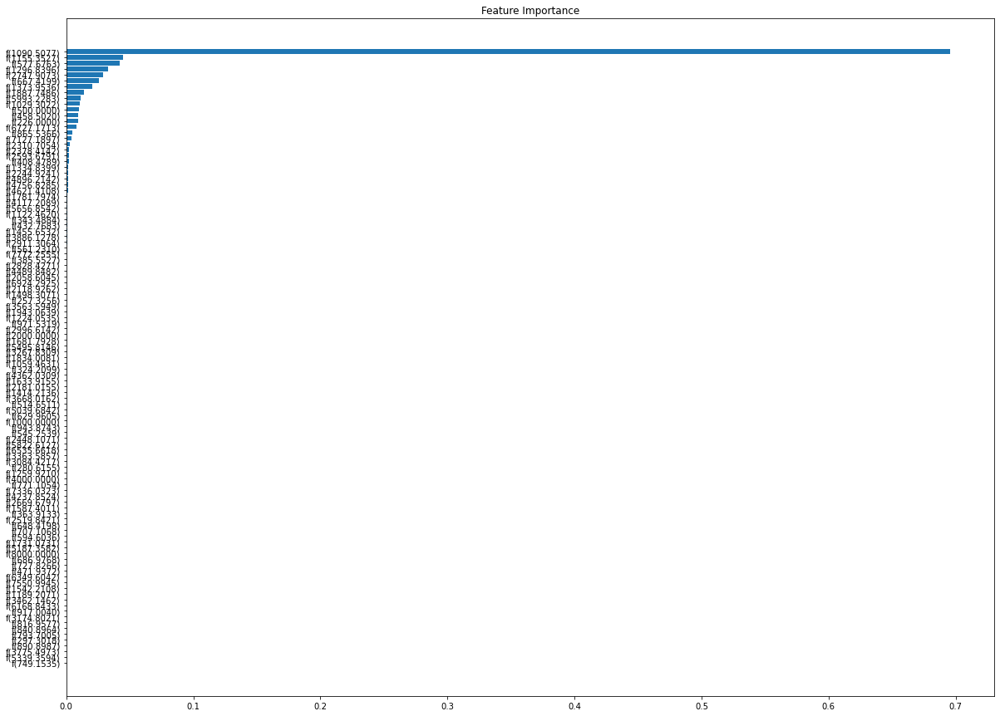

In [27]:
feature_importance = fs_model.feature_importances_
sorted_idx = np.argsort(feature_importance)
fig = plt.figure(figsize=(20, 15))
plt.barh(range(len(sorted_idx)), feature_importance[sorted_idx], align='center')
plt.yticks(range(len(sorted_idx)), np.array(frequency_test.columns)[sorted_idx])
plt.title('Feature Importance')

In [28]:
sorted_idx=sorted_idx[-20:]
f_list=list(np.array(frequency_test.columns)[sorted_idx])
f_list

['f(408.4789)',
 'f(2593.6791)',
 'f(2378.4142)',
 'f(2310.7054)',
 'f(7127.1897)',
 'f(865.5366)',
 'f(6727.1713)',
 'f(226.0000)',
 'f(458.5020)',
 'f(500.0000)',
 'f(1029.3022)',
 'f(5993.2283)',
 'f(1887.7486)',
 'f(1373.9536)',
 'f(667.4199)',
 'f(2747.9073)',
 'f(1296.8396)',
 'f(577.6763)',
 'f(1155.3527)',
 'f(1090.5077)']

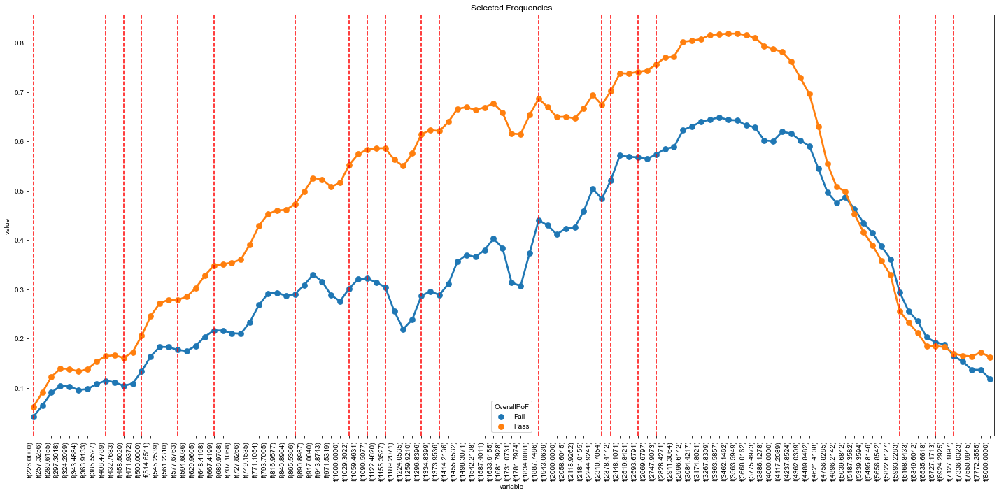

In [29]:
fig = plt.figure(figsize=(20, 10))
assess_freqs(wba_data, frequency_list, f_list)

We now have the f_list, which is the top 20 frequencies that we will select for the highest correlation.

### Train and teat sets after feature selection

'TPP', 'TympType', 'OAE1', 'OAE1.4', 'OAE2', 'OAE2.8', 'OAE4'

#### Final training and testing data

In [30]:
# original
# X_train = pd.concat([X_train.loc[:,['TPP', 'TympType', 'OAE1', 'OAE1.4', 'OAE2', 'OAE2.8', 'OAE4']],X_train[f_list]],axis=1)
# X_test = pd.concat([X_test.loc[:,['TPP', 'TympType', 'OAE1', 'OAE1.4', 'OAE2', 'OAE2.8', 'OAE4']],X_test[f_list]],axis=1)
X_train = X_train[f_list]
X_test = X_test[f_list]

In [31]:
# generative data
X_train_gen = X_train_gen[f_list]
X_test_gen = X_test_gen[f_list]

In [163]:
# after oversampling
X_train_over_large = X_train_over_large[f_list]
X_test_over_large = X_test_over_large[f_list]

In [161]:
# after SMOTE
X_train_smote_large = X_train_smote_large[f_list]
X_test_smote_large = X_test_smote_large[f_list]

In [162]:
# after Adasyn
X_train_adasyn_large = X_train_adasyn_large[f_list]
X_test_adasyn_large = X_test_adasyn_large[f_list]

#### view data

In [39]:
X_train.head()

,f(408.4789),f(2593.6791),f(2378.4142),f(2310.7054),f(7127.1897),f(865.5366),f(6727.1713),f(226.0000),f(458.5020),f(500.0000),f(1029.3022),f(5993.2283),f(1887.7486),f(1373.9536),f(667.4199),f(2747.9073),f(1296.8396),f(577.6763),f(1155.3527),f(1090.5077)
0,0.0538,0.6712,0.4938,0.4478,0.1956,0.2293,0.2709,0.0044,0.0309,0.0495,0.2009,0.4621,0.3844,0.1865,0.1433,0.7555,0.1841,0.0907,0.2103,0.2344
1,0.0689,0.8478,0.7828,0.7371,0.2789,0.3189,0.3381,0.0364,0.0599,0.1077,0.4167,0.4768,0.8366,0.4787,0.2103,0.8399,0.5119,0.1542,0.4387,0.4141
2,0.2371,0.6491,0.6827,0.6858,0.1961,0.4076,0.2064,0.0581,0.2291,0.2709,0.4437,0.2779,0.5040,0.5173,0.3734,0.6188,0.5211,0.3276,0.5004,0.5038
3,0.1050,0.6001,0.6846,0.6469,0.3378,0.4331,0.4001,0.0498,0.0955,0.1515,0.5456,0.5285,0.6283,0.6200,0.2664,0.5698,0.5979,0.2041,0.5736,0.5528
4,0.1336,0.4592,0.3856,0.3660,0.0000,0.4892,0.0000,0.0227,0.1283,0.1791,0.5451,0.0026,0.4929,0.5128,0.3649,0.4908,0.5497,0.2672,0.5757,0.5824


In [ ]:
X_test.head()

,f(408.4789),f(2593.6791),f(2378.4142),f(2310.7054),f(7127.1897),f(865.5366),f(6727.1713),f(226.0000),f(458.5020),f(500.0000),f(1029.3022),f(5993.2283),f(1887.7486),f(1373.9536),f(667.4199),f(2747.9073),f(1296.8396),f(577.6763),f(1155.3527),f(1090.5077)
0,0.2284,0.6784,0.6252,0.5973,0.1211,0.7598,0.1685,0.0654,0.2313,0.2957,0.9315,0.3433,0.5636,0.7442,0.5310,0.7210,0.7940,0.4128,0.9246,0.9544
1,0.2304,0.4966,0.5483,0.5793,0.2134,0.4241,0.1773,0.0800,0.2206,0.2590,0.4562,0.2287,0.6087,0.5521,0.3515,0.4621,0.5481,0.3113,0.5132,0.5049
2,0.1865,0.8640,0.7116,0.6566,0.0915,0.7285,0.0713,0.0434,0.1859,0.2456,0.8540,0.1569,0.6011,0.7677,0.4840,0.9162,0.7790,0.3650,0.8214,0.8624
3,0.1742,0.7097,0.7218,0.7193,0.2904,0.4502,0.3468,0.0391,0.1616,0.2055,0.5060,0.5813,0.8344,0.7748,0.3371,0.6885,0.6994,0.2778,0.5813,0.5557
4,0.2256,0.9472,0.8525,0.8085,0.2619,0.5260,0.3168,0.1663,0.2236,0.2618,0.6774,0.3439,0.7051,0.6109,0.3775,0.9607,0.6136,0.3198,0.6399,0.6792


In [32]:
X_train_gen.head()

,f(408.4789),f(2593.6791),f(2378.4142),f(2310.7054),f(7127.1897),f(865.5366),f(6727.1713),f(226.0000),f(458.5020),f(500.0000),f(1029.3022),f(5993.2283),f(1887.7486),f(1373.9536),f(667.4199),f(2747.9073),f(1296.8396),f(577.6763),f(1155.3527),f(1090.5077)
0,0.093929,0.555775,0.529648,0.512887,0.340229,0.421555,0.310563,0.068025,0.127342,0.144890,0.433959,0.435011,0.508177,0.535077,0.218858,0.577010,0.447779,0.210454,0.436798,0.502607
1,0.157342,0.614348,0.654497,0.626901,0.289355,0.547702,0.388134,0.079572,0.174582,0.219188,0.589796,0.366557,0.634917,0.554016,0.299416,0.629780,0.587265,0.245782,0.622175,0.682645
2,0.151021,0.489104,0.577279,0.486277,0.373305,0.434067,0.359684,0.081318,0.161163,0.216445,0.477197,0.348561,0.519865,0.510052,0.293083,0.609001,0.509668,0.223451,0.563914,0.537186
3,0.086680,0.485597,0.481315,0.435409,0.287531,0.336159,0.374172,0.049726,0.099336,0.129505,0.363090,0.536778,0.473016,0.348240,0.218803,0.477454,0.388454,0.158531,0.350702,0.390122
4,0.066974,0.755949,0.748868,0.669369,0.045525,0.388471,0.114813,0.004650,0.086742,0.136238,0.571427,0.124912,0.687682,0.593539,0.214775,0.850668,0.588042,0.146152,0.470006,0.567926


In [33]:
X_test_gen.head()

,f(408.4789),f(2593.6791),f(2378.4142),f(2310.7054),f(7127.1897),f(865.5366),f(6727.1713),f(226.0000),f(458.5020),f(500.0000),f(1029.3022),f(5993.2283),f(1887.7486),f(1373.9536),f(667.4199),f(2747.9073),f(1296.8396),f(577.6763),f(1155.3527),f(1090.5077)
0,0.087192,0.461581,0.471897,0.442292,0.290255,0.310254,0.289164,0.032583,0.089420,0.141001,0.340875,0.329727,0.456640,0.413262,0.211337,0.501758,0.361812,0.163605,0.368860,0.401498
1,0.074793,0.619217,0.582847,0.516170,0.203786,0.315625,0.262254,0.013374,0.089126,0.124245,0.365580,0.358453,0.508965,0.386544,0.195586,0.637282,0.426650,0.145203,0.348922,0.411135
2,0.076154,0.562082,0.483403,0.460356,0.301070,0.349625,0.289943,0.042657,0.084788,0.147025,0.379410,0.484295,0.495573,0.411394,0.263727,0.593928,0.430385,0.180061,0.398867,0.433155
3,0.135192,0.567343,0.642290,0.619577,0.307903,0.420870,0.294790,0.052007,0.130024,0.238243,0.479672,0.285514,0.555746,0.535862,0.274730,0.655992,0.540908,0.217663,0.606198,0.563986
4,0.094086,0.816090,0.770120,0.737217,0.066227,0.504635,0.102846,0.010474,0.107668,0.177094,0.669638,0.147464,0.719224,0.660740,0.282160,0.876998,0.694449,0.208512,0.662029,0.734614


### Use an 85/15 random split on the training set to form a validation set.

In [34]:
from sklearn.model_selection import train_test_split

# Nomal data
# random_state for reproducing 
X_train, X_val, y_train, y_val = train_test_split(X_train, y_train, test_size=0.15, random_state=42)
 
print('X_train shape:', X_train.shape)
 
print('number of train examples:', X_train.shape[0])
print('number of valid examples:', X_val.shape[0])
print('number of test examples:', X_test.shape[0])

X_train shape: (162, 20)
number of train examples: 162
number of valid examples: 29
number of test examples: 48


In [35]:
# Generative data (large)
# random_state for reproducing 
X_train_gen, X_val_gen, y_train_gen, y_val_gen = train_test_split(X_train_gen, y_train_gen, test_size=0.15, random_state=42)
 
print('X_train shape:', X_train_gen.shape)

print('number of train examples:', X_train_gen.shape[0])
print('number of valid examples:', X_val_gen.shape[0])
print('number of test examples:', X_test_gen.shape[0])

X_train shape: (16830, 20)
number of train examples: 16830
number of valid examples: 2970
number of test examples: 2200


In [164]:
# Oversampling data (large)
# random_state for reproducing 
X_train_over_large, X_val_over_large, y_train_over_large, y_val_over_large = train_test_split(X_train_over_large, y_train_over_large, test_size=0.15, random_state=42)
 
print('X_train shape:', X_train_over_large.shape)

print('number of train examples:', X_train_over_large.shape[0])
print('number of valid examples:', X_val_over_large.shape[0])
print('number of test examples:', X_test_over_large.shape[0])

X_train shape: (7225, 20)
number of train examples: 7225
number of valid examples: 1275
number of test examples: 1500


In [165]:
# SMOTE data (large)
# random_state for reproducing 
X_train_smote_large, X_val_smote_large, y_train_smote_large, y_val_smote_large = train_test_split(X_train_smote_large, y_train_smote_large, test_size=0.15, random_state=42)
 
print('X_train shape:', X_train_smote_large.shape)

print('number of train examples:', X_train_smote_large.shape[0])
print('number of valid examples:', X_val_smote_large.shape[0])
print('number of test examples:', X_test_smote_large.shape[0])

X_train shape: (7225, 20)
number of train examples: 7225
number of valid examples: 1275
number of test examples: 1500


In [166]:
# Adasyn data (large)
# random_state for reproducing 
X_train_adasyn_large, X_val_adasyn_large, y_train_adasyn_large, y_val_adasyn_large = train_test_split(X_train_adasyn_large, y_train_adasyn_large, test_size=0.15, random_state=42)
 
print('X_train shape:', X_train_adasyn_large.shape)

print('number of train examples:', X_train_adasyn_large.shape[0])
print('number of valid examples:', X_val_adasyn_large.shape[0])
print('number of test examples:', X_test_adasyn_large.shape[0])

X_train shape: (7226, 20)
number of train examples: 7226
number of valid examples: 1276
number of test examples: 1501


# Model Fitting - Nomal dataset

## Model Choosing

### Training Model Function

In [36]:
def model_train(model, name):
    model.fit(X_train, y_train)                                          # Fitting the model
    y_pred = model.predict(X_test)                                       # Making prediction from the trained model
    cm = confusion_matrix(y_test, y_pred)                               
    print("Grid Search Confusion Matrix " +" Validation Data")           # Displaying the Confusion Matrix
    print(cm)
    print('-----------------------')
    print('-----------------------')
    cr = classification_report(y_test, y_pred)
    print(name +" Classification Report " +" Validation Data")           # Displaying the Classification Report
    print(cr)
    print('------------------------')
    print(name +" AUC Score " +" Validation Data")
    auc = roc_auc_score(y_test, y_pred)       
    print("AUC Score " + str(auc))                                       # Displaying the AUC score
    print(name +" Recall " +" Validation Data")
    rec = recall_score(y_test, y_pred)
    print("Recall "+ str(rec))                                           # Displaying the Recall score
    print('_________________________')

    return auc, rec, model

### Decision Tree

#### before gridsearch

In [37]:
# dt = DecisionTreeClassifier(criterion = 'entropy',max_depth = 10, min_samples_leaf =3, random_state=101)
dt = DecisionTreeClassifier(random_state=42)

In [38]:
dt_auc, dt_rec, dt_model = model_train(dt, "Decision Tree")

Grid Search Confusion Matrix  Validation Data
[[38  2]
 [ 2  6]]
-----------------------
-----------------------
Decision Tree Classification Report  Validation Data
              precision    recall  f1-score   support

           0       0.95      0.95      0.95        40
           1       0.75      0.75      0.75         8

    accuracy                           0.92        48
   macro avg       0.85      0.85      0.85        48
weighted avg       0.92      0.92      0.92        48

------------------------
Decision Tree AUC Score  Validation Data
AUC Score 0.85
Decision Tree Recall  Validation Data
Recall 0.75
_________________________


The metric of our choice should be Recall as we want to minimize FN, which means that an attack accured but the model did not detect it.

In [39]:
dt.fit(X_train,y_train)
dt_prediction = dt.predict(X_test)
accuracy_dt = accuracy_score(dt_prediction,y_test)
cm_dt = confusion_matrix(dt_prediction,y_test)
prfs_dt = precision_recall_fscore_support(dt_prediction,y_test)
print('Accuracy: ',accuracy_dt)
print('\n')
print('Confusion Matrix: ',cm_dt)
print('\n')
print('Precision: ', prfs_dt[0])
print('Recall:    ', prfs_dt[1])
print('Fscore:    ', prfs_dt[2])
print('Support:   ', prfs_dt[3])

Accuracy:  0.9166666666666666


Confusion Matrix:  [[38  2]
 [ 2  6]]


Precision:  [0.95 0.75]
Recall:     [0.95 0.75]
Fscore:     [0.95 0.75]
Support:    [40  8]


In [40]:
## train set
dt.fit(X_train,y_train)
dt_prediction_train = dt.predict(X_train)
print("Random Forest Conclusion for Original Dataset of trainidation set")
print('Precision:         ',precision_score(y_train, dt_prediction_train))
print('F1-Score:          ',f1_score(y_true=y_train, y_pred=dt_prediction_train, average='macro')) # 也可以指定micro模式
print('Accuracy Scores:   ',accuracy_score(y_true=y_train, y_pred=dt_prediction_train))
print('Recall Scores:     ',recall_score(y_true=y_train,y_pred=dt_prediction_train,average='macro')) # 也可以指定micro模式
tn, fp, fn, tp = confusion_matrix(y_train, dt_prediction_train).ravel()
sensitivity = tp / (tp+fn)
specificity = tn / (tn+fp)
print('Sensitivity:       ',sensitivity)
print('Specificity:       ',specificity)

Random Forest Conclusion for Original Dataset of trainidation set
Precision:          1.0
F1-Score:           1.0
Accuracy Scores:    1.0
Recall Scores:      1.0
Sensitivity:        1.0
Specificity:        1.0


In [41]:
## test set
dt.fit(X_train,y_train)
dt_prediction = dt.predict(X_test)
print("Decision Tree Conclusion for Original Dataset")
print('Precision:         ',precision_score(y_test, dt_prediction))
print('F1-Score:          ',f1_score(y_true=y_test, y_pred=dt_prediction, average='macro')) # 也可以指定micro模式
print('Accuracy Scores:   ',accuracy_score(y_true=y_test, y_pred=dt_prediction))
print('Recall Scores:     ',recall_score(y_true=y_test,y_pred=dt_prediction,average='macro')) # 也可以指定micro模式
tn, fp, fn, tp = confusion_matrix(y_test, dt_prediction).ravel()
sensitivity = tp / (tp+fn)
specificity = tn / (tn+fp)
print('Sensitivity:       ',sensitivity)
print('Specificity:       ',specificity)

Decision Tree Conclusion for Original Dataset
Precision:          0.75
F1-Score:           0.8500000000000001
Accuracy Scores:    0.9166666666666666
Recall Scores:      0.85
Sensitivity:        0.75
Specificity:        0.95


In [42]:
## validation set
dt.fit(X_train,y_train)
dt_prediction = dt.predict(X_val)
print("Random Forest Conclusion for Original Dataset of validation set")
print('Precision:         ',precision_score(y_val, dt_prediction))
print('F1-Score:          ',f1_score(y_true=y_val, y_pred=dt_prediction, average='macro')) # 也可以指定micro模式
print('Accuracy Scores:   ',accuracy_score(y_true=y_val, y_pred=dt_prediction))
print('Recall Scores:     ',recall_score(y_true=y_val,y_pred=dt_prediction,average='macro')) # 也可以指定micro模式
tn, fp, fn, tp = confusion_matrix(y_val, dt_prediction).ravel()
sensitivity = tp / (tp+fn)
specificity = tn / (tn+fp)
print('Sensitivity:       ',sensitivity)
print('Specificity:       ',specificity)

Random Forest Conclusion for Original Dataset of validation set
Precision:          1.0
F1-Score:           0.855
Accuracy Scores:    0.9310344827586207
Recall Scores:      0.8
Sensitivity:        0.6
Specificity:        1.0


In [43]:
y_train_pred_dt_cross = cross_val_predict(dt, X_train, y_train, cv=3)
confusion_matrix(y_train, y_train_pred_dt_cross)

array([[130,   7],
       [  8,  17]])

<Figure size 1440x720 with 0 Axes>

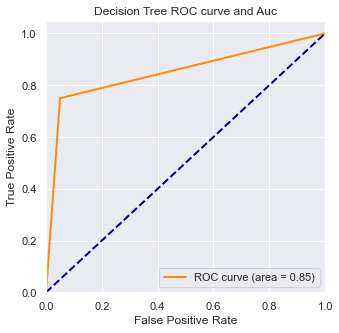

In [44]:
## The value of y_score calculated by decision_function() is used in the roc_curve() function
y_score_dt = dt.fit(X_train, np.ravel(y_train)).predict(X_test)

# Compute ROC curve and ROC area for each class
fpr_dt,tpr_dt,threshold_dt = roc_curve(np.ravel(y_test), y_score_dt) ## Calculation of true rate and false positive rate
roc_auc_dt = auc(fpr_dt,tpr_dt) ## Calculate the value of auc

plt.figure()
lw = 2
plt.figure(figsize=(5,5))
plt.plot(fpr_dt, tpr_dt, color='darkorange',
         lw=lw, label='ROC curve (area = %0.2f)' % roc_auc_dt)
plt.plot([0, 1], [0, 1], color='navy', lw=lw, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Decision Tree ROC curve and Auc')
plt.legend(loc="lower right")
plt.show()

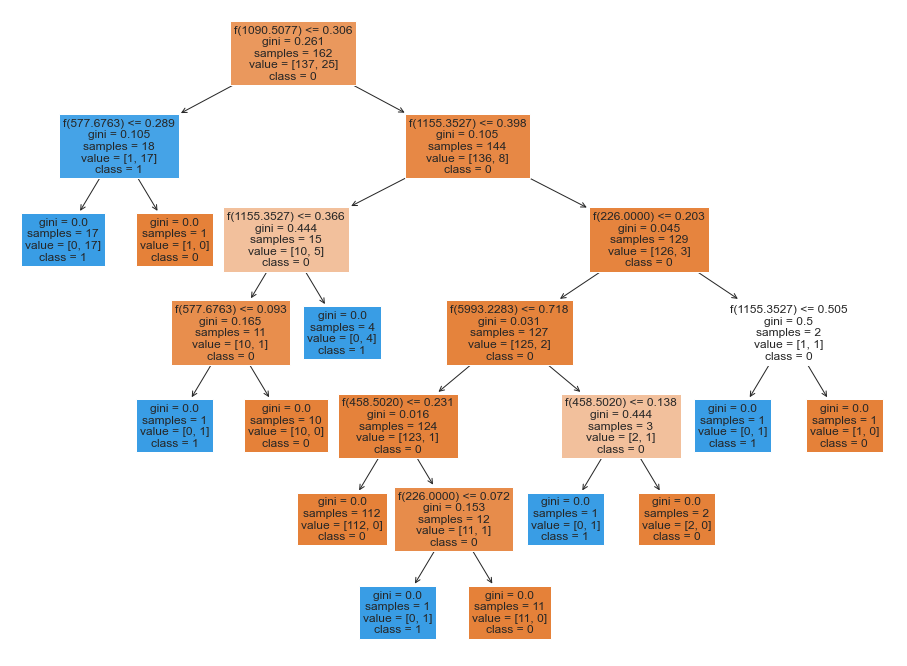

In [45]:
# visualising the decision tree diagram
fig = plt.figure(figsize=(16,12))
a_dt = plot_tree(dt, feature_names=X_train.columns, fontsize=12, filled=True, class_names=['0', '1'])

#### Decision Tree GridSearch

In [46]:
paramGride = dict(
    max_depth = [3,5,6,7,8,10,15,None],
    max_leaf_nodes = [3,5,6,7,8,10,12,15,None])

dtModel_normal = DecisionTreeClassifier()

dt_normal_grid = GridSearchCV(
    dtModel_normal,paramGride,cv = 3,return_train_score = True)
dt_normal_grid = dt_normal_grid.fit(X_train,y_train)

In [47]:
print('best_score:%f'% dt_normal_grid.best_score_)
print('best parameter:')

for key in dt_normal_grid.best_params_.keys():
    print('%s = %s'%(key,dt_normal_grid.best_params_[key]))

best_score:0.938272
best parameter:
max_depth = 3
max_leaf_nodes = 3


In [48]:
dt_normal_grid.best_estimator_

DecisionTreeClassifier(max_depth=3, max_leaf_nodes=3)

In [49]:
dt_normal_grid_model = DecisionTreeClassifier(max_depth=3, max_leaf_nodes=3)

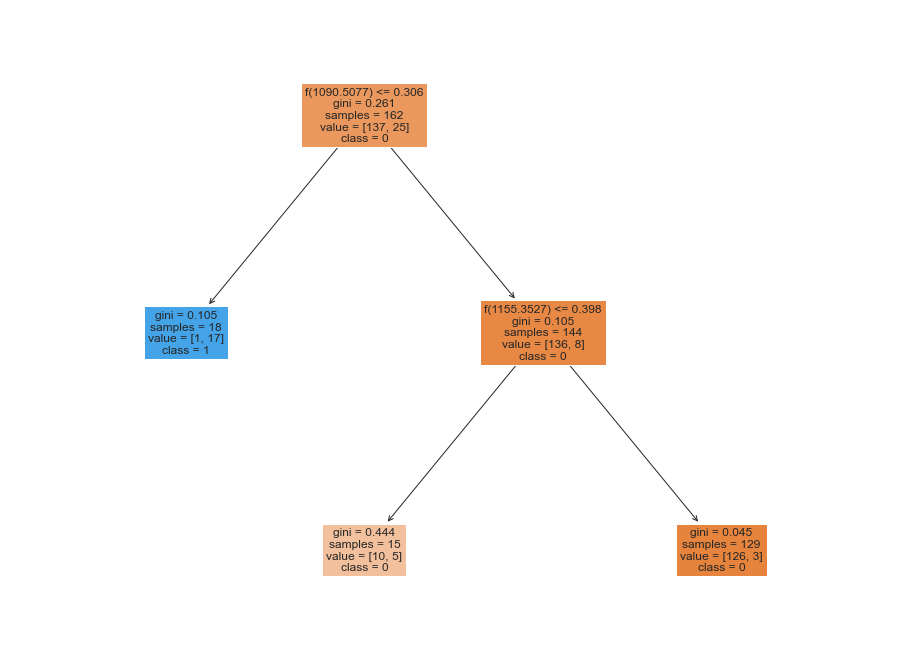

In [50]:
# dtree = DecisionTreeClassifier(criterion='entropy',max_depth=10)
dt_normal_grid_model.fit(X_train,y_train)
predictions_dt_normal_large_grid = dt_normal_grid_model.predict(X_test)
# visualising the decision tree diagram
fig = plt.figure(figsize=(16,12))
a_rf_normal_large = plot_tree(dt_normal_grid_model, feature_names=X_train.columns, fontsize=12, filled=True, class_names=['0', '1'])

In [51]:
## train set
dt_normal_grid_model.fit(X_train,y_train)
dt_normal_large_prediction_train = dt_normal_grid_model.predict(X_train)
print("Decision Tree Conclusion for normal Dataset of train set")
print('Precision:         ',precision_score(y_train, dt_normal_large_prediction_train))
print('F1-Score:          ',f1_score(y_true=y_train, y_pred=dt_normal_large_prediction_train, average='macro'))
print('Accuracy Scores:   ',accuracy_score(y_true=y_train, y_pred=dt_normal_large_prediction_train))
print('Recall Scores:     ',recall_score(y_true=y_train,y_pred=dt_normal_large_prediction_train,average='macro'))
tn, fp, fn, tp = confusion_matrix(y_train, dt_normal_large_prediction_train).ravel()
sensitivity = tp / (tp+fn)
specificity = tn / (tn+fp)
print('Sensitivity:       ',sensitivity)
print('Specificity:       ',specificity)

Decision Tree Conclusion for normal Dataset of train set
Precision:          0.9444444444444444
F1-Score:           0.8793346023338575
Accuracy Scores:    0.9444444444444444
Recall Scores:      0.8363503649635037
Sensitivity:        0.68
Specificity:        0.9927007299270073


In [52]:
## test set
dt_normal_grid_model.fit(X_train,y_train)
dt_normal_large_prediction = dt_normal_grid_model.predict(X_test)
print("Decision Tree Conclusion for normal Dataset of test set")
print('Precision:         ',precision_score(y_test, dt_normal_large_prediction))
print('F1-Score:          ',f1_score(y_true=y_test, y_pred=dt_normal_large_prediction, average='macro'))
print('Accuracy Scores:   ',accuracy_score(y_true=y_test, y_pred=dt_normal_large_prediction))
print('Recall Scores:     ',recall_score(y_true=y_test,y_pred=dt_normal_large_prediction,average='macro'))
tn, fp, fn, tp = confusion_matrix(y_test, dt_normal_large_prediction).ravel()
sensitivity = tp / (tp+fn)
specificity = tn / (tn+fp)
print('Sensitivity:       ',sensitivity)
print('Specificity:       ',specificity)

Decision Tree Conclusion for normal Dataset of test set
Precision:          1.0
F1-Score:           0.8665430954587581
Accuracy Scores:    0.9375
Recall Scores:      0.8125
Sensitivity:        0.625
Specificity:        1.0


In [53]:
## validation set
y_valpred_dt_normal_large = dt_normal_grid_model.predict(X_val)
print("Decision Tree Conclusion for normal Dataset of val set")
print('Precision:         ',precision_score(y_val, y_valpred_dt_normal_large))
print('F1-Score:          ',f1_score(y_true=y_val, y_pred=y_valpred_dt_normal_large, average='macro'))
print('Accuracy Scores:   ',accuracy_score(y_true=y_val, y_pred=y_valpred_dt_normal_large))
print('Recall Scores:     ',recall_score(y_true=y_val,y_pred=y_valpred_dt_normal_large,average='macro'))
tn, fp, fn, tp = confusion_matrix(y_val, y_valpred_dt_normal_large).ravel()
sensitivity = tp / (tp+fn)
specificity = tn / (tn+fp)
print('Sensitivity:       ',sensitivity)
print('Specificity:       ',specificity)

Decision Tree Conclusion for normal Dataset of val set
Precision:          1.0
F1-Score:           0.855
Accuracy Scores:    0.9310344827586207
Recall Scores:      0.8
Sensitivity:        0.6
Specificity:        1.0


<Figure size 1440x720 with 0 Axes>

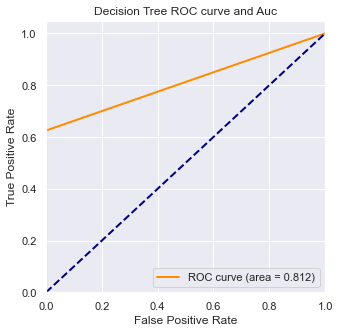

In [54]:
y_score_dt_normal_large = dt_normal_grid_model.fit(X_train, np.ravel(y_train)).predict(X_test)

# Compute ROC curve and ROC area for each class
fpr_dt_normal_large,tpr_dt_normal_large,threshold_dt_normal_large = roc_curve(np.ravel(y_test), y_score_dt_normal_large) 
roc_auc_dt_normal_large = auc(fpr_dt_normal_large,tpr_dt_normal_large) 

plt.figure()
lw = 2
plt.figure(figsize=(5,5))
plt.plot(fpr_dt_normal_large, tpr_dt_normal_large, color='darkorange',
         lw=lw, label='ROC curve (area = %0.3f)' % roc_auc_dt_normal_large) 
plt.plot([0, 1], [0, 1], color='navy', lw=lw, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Decision Tree ROC curve and Auc')
plt.legend(loc="lower right")
plt.show()

### Random Forest

In [55]:
# Random Forest Algorithm
rf = RandomForestClassifier(random_state=42)

In [56]:
rf_auc, rf_rec, rf_model = model_train(rf, "Random Forest Classifier")

Grid Search Confusion Matrix  Validation Data
[[40  0]
 [ 2  6]]
-----------------------
-----------------------
Random Forest Classifier Classification Report  Validation Data
              precision    recall  f1-score   support

           0       0.95      1.00      0.98        40
           1       1.00      0.75      0.86         8

    accuracy                           0.96        48
   macro avg       0.98      0.88      0.92        48
weighted avg       0.96      0.96      0.96        48

------------------------
Random Forest Classifier AUC Score  Validation Data
AUC Score 0.875
Random Forest Classifier Recall  Validation Data
Recall 0.75
_________________________


In [57]:
## train set
rf.fit(X_train,y_train)
rf_prediction_train = rf.predict(X_train)
print("Random Forest Conclusion for Original Dataset of trainidation set")
print('Precision:         ',precision_score(y_train, rf_prediction_train))
print('F1-Score:          ',f1_score(y_true=y_train, y_pred=rf_prediction_train, average='macro')) # 也可以指定micro模式
print('Accuracy Scores:   ',accuracy_score(y_true=y_train, y_pred=rf_prediction_train))
print('Recall Scores:     ',recall_score(y_true=y_train,y_pred=rf_prediction_train,average='macro')) # 也可以指定micro模式
tn, fp, fn, tp = confusion_matrix(y_train, rf_prediction_train).ravel()
sensitivity = tp / (tp+fn)
specificity = tn / (tn+fp)
print('Sensitivity:       ',sensitivity)
print('Specificity:       ',specificity)

Random Forest Conclusion for Original Dataset of trainidation set
Precision:          1.0
F1-Score:           1.0
Accuracy Scores:    1.0
Recall Scores:      1.0
Sensitivity:        1.0
Specificity:        1.0


In [58]:
## test set
rf.fit(X_train,y_train)
rf_prediction = rf.predict(X_test)
print("Random Forest Conclusion for Original Dataset of validation set")
print('Precision:         ',precision_score(y_test, rf_prediction))
print('F1-Score:          ',f1_score(y_true=y_test, y_pred=rf_prediction, average='macro')) # 也可以指定micro模式
print('Accuracy Scores:   ',accuracy_score(y_true=y_test, y_pred=rf_prediction))
print('Recall Scores:     ',recall_score(y_true=y_test,y_pred=rf_prediction,average='macro')) # 也可以指定micro模式
tn, fp, fn, tp = confusion_matrix(y_test, rf_prediction).ravel()
sensitivity = tp / (tp+fn)
specificity = tn / (tn+fp)
print('Sensitivity:       ',sensitivity)
print('Specificity:       ',specificity)

Random Forest Conclusion for Original Dataset of validation set
Precision:          1.0
F1-Score:           0.9163763066202091
Accuracy Scores:    0.9583333333333334
Recall Scores:      0.875
Sensitivity:        0.75
Specificity:        1.0


In [59]:
## validation set
rf.fit(X_train,y_train)
rf_prediction = rf.predict(X_val)
print("Random Forest Conclusion for Original Dataset of validation set")
print('Precision:         ',precision_score(y_val, rf_prediction))
print('F1-Score:          ',f1_score(y_true=y_val, y_pred=rf_prediction, average='macro')) # 也可以指定micro模式
print('Accuracy Scores:   ',accuracy_score(y_true=y_val, y_pred=rf_prediction))
print('Recall Scores:     ',recall_score(y_true=y_val,y_pred=rf_prediction,average='macro')) # 也可以指定micro模式
tn, fp, fn, tp = confusion_matrix(y_val, rf_prediction).ravel()
sensitivity = tp / (tp+fn)
specificity = tn / (tn+fp)
print('Sensitivity:       ',sensitivity)
print('Specificity:       ',specificity)

Random Forest Conclusion for Original Dataset of validation set
Precision:          1.0
F1-Score:           0.9342403628117915
Accuracy Scores:    0.9655172413793104
Recall Scores:      0.9
Sensitivity:        0.8
Specificity:        1.0


<Figure size 1440x720 with 0 Axes>

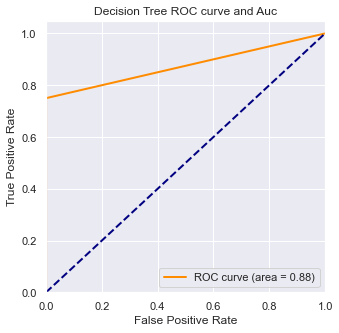

In [60]:
y_score_rf = rf.fit(X_train, np.ravel(y_train)).predict(X_test)

# Compute ROC curve and ROC area for each class
fpr_rf,tpr_rf,threshold_rf = roc_curve(np.ravel(y_test), y_score_rf) ###计算真正率和假正率
roc_auc_rf = auc(fpr_rf,tpr_rf) ###计算auc的值

plt.figure()
lw = 2
plt.figure(figsize=(5,5))
plt.plot(fpr_rf, tpr_rf, color='darkorange',
         lw=lw, label='ROC curve (area = %0.2f)' % roc_auc_rf) ###假正率为横坐标，真正率为纵坐标做曲线
plt.plot([0, 1], [0, 1], color='navy', lw=lw, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Decision Tree ROC curve and Auc')
plt.legend(loc="lower right")
plt.show()

### Grid Search

In [61]:
random_grid = {'n_estimators': range(5,20),
              'max_features' : ['auto', 'sqrt'],
              'max_depth' : [5,10,15,20],
              'min_samples_split':[2,5,10],
              'min_samples_leaf':[1,2,4]}

rf_gs = GridSearchCV(rf, random_grid, cv = 3, n_jobs=-1, verbose=2)

rf_gs.fit(X_train, np.ravel(y_train))
y_pred = rf_gs.predict(X_test)

Fitting 3 folds for each of 1080 candidates, totalling 3240 fits
[CV] END max_depth=5, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=5; total time=   0.1s
[CV] END max_depth=5, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=6; total time=   0.1s
[CV] END max_depth=5, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=5; total time=   0.1s
[CV] END max_depth=5, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=7; total time=   0.1s
[CV] END max_depth=5, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=5; total time=   0.1s
[CV] END max_depth=5, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=7; total time=   0.1s
[CV] END max_depth=5, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=8; total time=   0.0s
[CV] END max_depth=5, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=6; total time=   0.1s

In [62]:
rf_gs.best_estimator_

RandomForestClassifier(max_depth=5, min_samples_leaf=2, min_samples_split=10,
                       n_estimators=8, random_state=42)

In [63]:
rf_gs_model=RandomForestClassifier(max_depth=5, min_samples_leaf=2, min_samples_split=10, n_estimators=8, random_state=42)
rf_gs_model.fit(X_train, y_train)
y_pred_rf_gs = rf_gs_model.predict(X_test)

In [64]:
print("Grid Search Validation Data")
cm_rf_gs = confusion_matrix(y_test, y_pred_rf_gs)                               
print("Grid Search Confusion Matrix " +" Validation Data")                # Displaying the Confusion Matrix
print(cm_rf_gs)
print('-----------------------')
cr_rf_gs = classification_report(y_test, y_pred_rf_gs)
print("Grid Search Classification Report " +" Validation Data")           # Displaying the Classification Report
print(cr_rf_gs)
print('------------------------')
print("Grid Search AUC Score " +" Validation Data")
auc_rf_gs = roc_auc_score(y_test, y_pred_rf_gs)       
print("AUC Score " + str(auc_rf_gs))                                       # Displaying the AUC score
print("Grid Search Recall " +" Validation Data")
rec_rf_gs = recall_score(y_test, y_pred_rf_gs)
print("Recall "+ str(rec_rf_gs))                                           # Displaying the Recall score

Grid Search Validation Data
Grid Search Confusion Matrix  Validation Data
[[40  0]
 [ 2  6]]
-----------------------
Grid Search Classification Report  Validation Data
              precision    recall  f1-score   support

           0       0.95      1.00      0.98        40
           1       1.00      0.75      0.86         8

    accuracy                           0.96        48
   macro avg       0.98      0.88      0.92        48
weighted avg       0.96      0.96      0.96        48

------------------------
Grid Search AUC Score  Validation Data
AUC Score 0.875
Grid Search Recall  Validation Data
Recall 0.75


In [66]:
## train set
rf_gs_model.fit(X_train,y_train)
rf_gs_prediction_train = rf_gs_model.predict(X_train)
print("Random Forest Conclusion for Normal Dataset of train set")
print('Precision:         ',precision_score(y_train, rf_gs_prediction_train))
print('F1-Score:          ',f1_score(y_true=y_train, y_pred=rf_gs_prediction_train, average='macro'))
print('Accuracy Scores:   ',accuracy_score(y_true=y_train, y_pred=rf_gs_prediction_train))
print('Recall Scores:     ',recall_score(y_true=y_train,y_pred=rf_gs_prediction_train,average='macro'))
tn, fp, fn, tp = confusion_matrix(y_train, rf_gs_prediction_train).ravel()
sensitivity = tp / (tp+fn)
specificity = tn / (tn+fp)
print('Sensitivity:       ',sensitivity)
print('Specificity:       ',specificity)

Random Forest Conclusion for Normal Dataset of train set
Precision:          0.9090909090909091
F1-Score:           0.9128965358322452
Accuracy Scores:    0.9567901234567902
Recall Scores:      0.8927007299270073
Sensitivity:        0.8
Specificity:        0.9854014598540146


In [67]:
## test set
rf_gs_model.fit(X_train,y_train)
rf_gs_prediction_test = rf_gs_model.predict(X_test)
print("Random Forest Conclusion for Normal Dataset of test set")
print('Precision:         ',precision_score(y_test, rf_gs_prediction_test))
print('F1-Score:          ',f1_score(y_true=y_test, y_pred=rf_gs_prediction_test, average='macro'))
print('Accuracy Scores:   ',accuracy_score(y_true=y_test, y_pred=rf_gs_prediction_test))
print('Recall Scores:     ',recall_score(y_true=y_test,y_pred=rf_gs_prediction_test,average='macro'))
tn, fp, fn, tp = confusion_matrix(y_test, rf_gs_prediction_test).ravel()
sensitivity = tp / (tp+fn)
specificity = tn / (tn+fp)
print('Sensitivity:       ',sensitivity)
print('Specificity:       ',specificity)

Random Forest Conclusion for Normal Dataset of test set
Precision:          1.0
F1-Score:           0.9163763066202091
Accuracy Scores:    0.9583333333333334
Recall Scores:      0.875
Sensitivity:        0.75
Specificity:        1.0


In [79]:
## validation set
rf_gs_model.fit(X_val,y_val)
y_valpred_rf_gs = rf_gs_model.predict(X_val)
print("Random Forest Conclusion for Original Dataset")
print('Precision:         ',precision_score(np.ravel(y_val), y_valpred_rf_gs))
print('F1-Score:          ',f1_score(y_true=y_val, y_pred=y_valpred_rf_gs, average='macro')) # 也可以指定micro模式
print('Accuracy Scores:   ',accuracy_score(y_true=np.ravel(y_val), y_pred=y_valpred_rf_gs))
print('Recall Scores:     ',recall_score(y_true=np.ravel(y_val),y_pred=y_valpred_rf_gs,average='macro')) 
tn, fp, fn, tp = confusion_matrix(np.ravel(y_val), y_valpred_rf_gs).ravel()
sensitivity = tp / (tp+fn)
specificity = tn / (tn+fp)
print('Sensitivity:       ',sensitivity)
print('Specificity:       ',specificity)

Random Forest Conclusion for Original Dataset
Precision:          1.0
F1-Score:           0.9342403628117915
Accuracy Scores:    0.9655172413793104
Recall Scores:      0.9
Sensitivity:        0.8
Specificity:        1.0


<Figure size 1440x720 with 0 Axes>

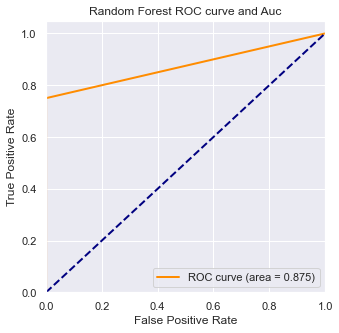

In [69]:
###通过decision_function()计算得到的y_score的值，用在roc_curve()函数中
y_score_rf_gs = rf_gs_model.fit(X_train, y_train).predict(X_test)

# Compute ROC curve and ROC area for each class
fpr_rf_gs,tpr_rf_gs,threshold_rf_gs = roc_curve(np.ravel(y_test), y_score_rf_gs) ###计算真正率和假正率
roc_auc_rf_gs = auc(fpr_rf_gs,tpr_rf_gs) ###计算auc的值

plt.figure()
lw = 2
plt.figure(figsize=(5,5))
plt.plot(fpr_rf_gs, tpr_rf_gs, color='darkorange',
         lw=lw, label='ROC curve (area = %0.3f)' % roc_auc_rf_gs) ###假正率为横坐标，真正率为纵坐标做曲线
plt.plot([0, 1], [0, 1], color='navy', lw=lw, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Random Forest ROC curve and Auc')
plt.legend(loc="lower right")
plt.show()

### Randomized Grid Search

In [140]:
rf_random = RandomizedSearchCV(rf, random_grid, cv = 3, n_jobs=-1, verbose=2)

rf_random.fit(X_train, np.ravel(y_train))
y_pred_random = rf_random.predict(X_test)

Fitting 3 folds for each of 10 candidates, totalling 30 fits
[CV] END max_depth=20, max_features=auto, min_samples_leaf=4, min_samples_split=10, n_estimators=8; total time=   0.1s
[CV] END max_depth=10, max_features=auto, min_samples_leaf=1, min_samples_split=5, n_estimators=10; total time=   0.1s
[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=2, min_samples_split=10, n_estimators=16; total time=   0.1s
[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=2, min_samples_split=10, n_estimators=16; total time=   0.1s
[CV] END max_depth=20, max_features=auto, min_samples_leaf=4, min_samples_split=10, n_estimators=8; total time=   0.1s
[CV] END max_depth=20, max_features=auto, min_samples_leaf=4, min_samples_split=10, n_estimators=8; total time=   0.1s
[CV] END max_depth=10, max_features=auto, min_samples_leaf=1, min_samples_split=5, n_estimators=10; total time=   0.1s
[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=2, min_samples_split=10, n_estimators=16; total 

In [141]:
rf_random.best_estimator_

RandomForestClassifier(max_depth=5, max_features='sqrt', min_samples_leaf=2,
                       min_samples_split=10, n_estimators=16, random_state=42)

In [72]:
rf_random_model=RandomForestClassifier(max_depth=10, min_samples_leaf=2, min_samples_split=10,
                       n_estimators=9, random_state=42)
rf_random_model.fit(X_train, np.ravel(y_train))
y_pred_random = rf_random_model.predict(X_test)

In [73]:
print("Randomized Grid Search Validation Data")
cm_rf_random = confusion_matrix(y_test, y_pred_random)                               
print("Randomized Grid Search Confusion Matrix " +" Validation Data")                # Displaying the Confusion Matrix
print(cm_rf_random)
print('-----------------------')
cr_rf_random = classification_report(y_test, y_pred_random)
print("Randomized Grid Search Classification Report " +" Validation Data")           # Displaying the Classification Report
print(cr_rf_random)
print('------------------------')
print("Randomized Grid Search AUC Score " +" Validation Data")
auc_rf_random = roc_auc_score(y_test, y_pred_random)       
print("AUC Score " + str(auc_rf_random))                                       # Displaying the AUC score
print("Randomized Grid Search Recall " +" Validation Data")
rec_rf_random = recall_score(y_test, y_pred_random)
print("Recall "+ str(rec_rf_random))                                           # Displaying the Recall score

Randomized Grid Search Validation Data
Randomized Grid Search Confusion Matrix  Validation Data
[[40  0]
 [ 2  6]]
-----------------------
Randomized Grid Search Classification Report  Validation Data
              precision    recall  f1-score   support

           0       0.95      1.00      0.98        40
           1       1.00      0.75      0.86         8

    accuracy                           0.96        48
   macro avg       0.98      0.88      0.92        48
weighted avg       0.96      0.96      0.96        48

------------------------
Randomized Grid Search AUC Score  Validation Data
AUC Score 0.875
Randomized Grid Search Recall  Validation Data
Recall 0.75


In [74]:
## train set
rf_random_model.fit(X_train,y_train)
rf_random_prediction_train = rf_random_model.predict(X_train)
print("Random Forest Conclusion for NORMAL Dataset of train set")
print('Precision:         ',precision_score(y_train, rf_random_prediction_train))
print('F1-Score:          ',f1_score(y_true=y_train, y_pred=rf_random_prediction_train, average='macro'))
print('Accuracy Scores:   ',accuracy_score(y_true=y_train, y_pred=rf_random_prediction_train))
print('Recall Scores:     ',recall_score(y_true=y_train,y_pred=rf_random_prediction_train,average='macro'))
tn, fp, fn, tp = confusion_matrix(y_train, rf_random_prediction_train).ravel()
sensitivity = tp / (tp+fn)
specificity = tn / (tn+fp)
print('Sensitivity:       ',sensitivity)
print('Specificity:       ',specificity)

Random Forest Conclusion for NORMAL Dataset of train set
Precision:          0.9090909090909091
F1-Score:           0.9128965358322452
Accuracy Scores:    0.9567901234567902
Recall Scores:      0.8927007299270073
Sensitivity:        0.8
Specificity:        0.9854014598540146


In [75]:
## test set
rf_random_model.fit(X_train,y_train)
rf_random_prediction_test = rf_random_model.predict(X_test)
print("Random Forest Conclusion for NORMAL Dataset of test set")
print('Precision:         ',precision_score(y_test, rf_random_prediction_test))
print('F1-Score:          ',f1_score(y_true=y_test, y_pred=rf_random_prediction_test, average='macro'))
print('Accuracy Scores:   ',accuracy_score(y_true=y_test, y_pred=rf_random_prediction_test))
print('Recall Scores:     ',recall_score(y_true=y_test,y_pred=rf_random_prediction_test,average='macro'))
tn, fp, fn, tp = confusion_matrix(y_test, rf_random_prediction_test).ravel()
sensitivity = tp / (tp+fn)
specificity = tn / (tn+fp)
print('Sensitivity:       ',sensitivity)
print('Specificity:       ',specificity)

Random Forest Conclusion for NORMAL Dataset of test set
Precision:          1.0
F1-Score:           0.9163763066202091
Accuracy Scores:    0.9583333333333334
Recall Scores:      0.875
Sensitivity:        0.75
Specificity:        1.0


In [76]:
## validation set
rf_random_model.fit(X_train,y_train)
rf_random_prediction_val = rf_random_model.predict(X_val)
print("Random Forest Conclusion for NORMAL Dataset of val set")
print('Precision:         ',precision_score(y_val, rf_random_prediction_val))
print('F1-Score:          ',f1_score(y_true=y_val, y_pred=rf_random_prediction_val, average='macro'))
print('Accuracy Scores:   ',accuracy_score(y_true=y_val, y_pred=rf_random_prediction_val))
print('Recall Scores:     ',recall_score(y_true=y_val,y_pred=rf_random_prediction_val,average='macro'))
tn, fp, fn, tp = confusion_matrix(y_val, rf_random_prediction_val).ravel()
sensitivity = tp / (tp+fn)
specificity = tn / (tn+fp)
print('Sensitivity:       ',sensitivity)
print('Specificity:       ',specificity)

Random Forest Conclusion for NORMAL Dataset of val set
Precision:          1.0
F1-Score:           0.9342403628117915
Accuracy Scores:    0.9655172413793104
Recall Scores:      0.9
Sensitivity:        0.8
Specificity:        1.0


<Figure size 1440x720 with 0 Axes>

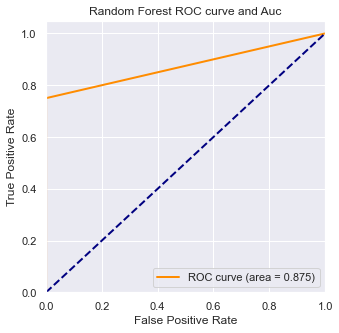

In [80]:
###通过decision_function()计算得到的y_score的值，用在roc_curve()函数中
y_score_rf_random = rf_random_model.fit(X_train, np.ravel(y_train)).predict(X_test)

# Compute ROC curve and ROC area for each class
fpr_rf_random,tpr_rf_random,threshold_rf_random = roc_curve(np.ravel(y_test), y_score_rf_random) ###计算真正率和假正率
roc_auc_rf_random = auc(fpr_rf_random,tpr_rf_random) ###计算auc的值

plt.figure()
lw = 2
plt.figure(figsize=(5,5))
plt.plot(fpr_rf_random, tpr_rf_random, color='darkorange',
         lw=lw, label='ROC curve (area = %0.3f)' % roc_auc_rf_random) ###假正率为横坐标，真正率为纵坐标做曲线
plt.plot([0, 1], [0, 1], color='navy', lw=lw, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Random Forest ROC curve and Auc')
plt.legend(loc="lower right")
plt.show()

### Scores for Train and Validation data

In [ ]:
rf_y_train_pred=rf_random.predict(X_train)
print('Accuracy score of train data :{}'.format(rf_random.score(X_train,y_train)))
print('Train data f1_Score:{}'.format(f1_score(y_train, rf_y_train_pred)))

rf_y_val_pred=rf_random.predict(X_val)
print('Accuracy score of validation  data :{}'.format(rf_random.score(X_val,y_val)))
print('validation data f1_Score:{}'.format(f1_score(y_val, rf_y_val_pred)))

Accuracy score of train data :0.9629629629629629
Train data f1_Score:0.8749999999999999
Accuracy score of validation  data :0.9655172413793104
validation data f1_Score:0.888888888888889


Fitting 3 folds for each of 10 candidates, totalling 30 fits
[CV] END max_depth=15, max_features=auto, min_samples_leaf=2, min_samples_split=10, n_estimators=14; total time=   0.0s
[CV] END max_depth=15, max_features=auto, min_samples_leaf=2, min_samples_split=10, n_estimators=14; total time=   0.0s[CV] END max_depth=15, max_features=auto, min_samples_leaf=2, min_samples_split=10, n_estimators=14; total time=   0.0s

[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=4, min_samples_split=10, n_estimators=17; total time=   0.0s
[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=4, min_samples_split=10, n_estimators=17; total time=   0.0s
[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=4, min_samples_split=10, n_estimators=13; total time=   0.0s
[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=4, min_samples_split=10, n_estimators=17; total time=   0.0s
[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=4, min_samples_split=10, n_estimators=13

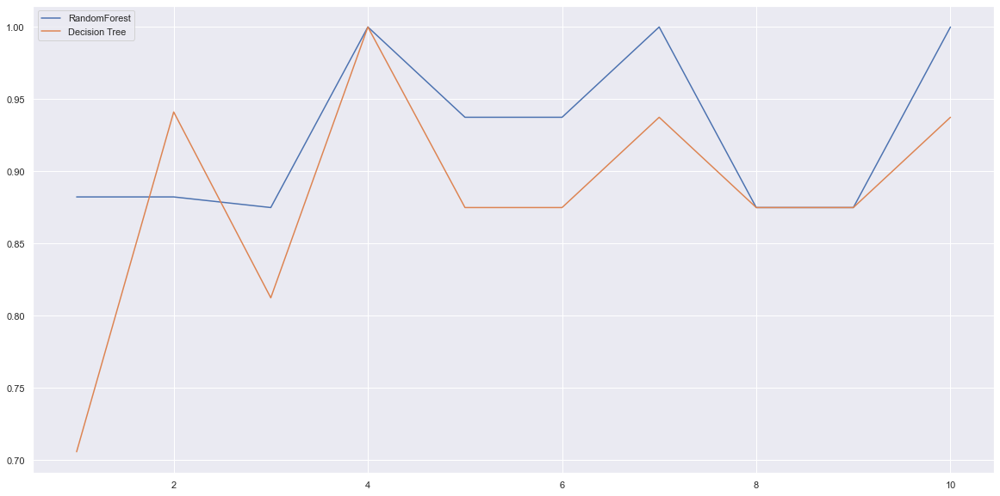

In [ ]:
#随机森林
# rfc=RandomForestClassifier(n_estimators=25)
rfc_s=cross_val_score(rf_random,X_train,np.ravel(y_train),cv=10)
#决策树
# clf=DecisionTreeClassifier(random_state=0)
clf_s=cross_val_score(dt,X_train,np.ravel(y_train),cv=10)
#绘制十折交叉验证
plt.plot(range(1,11),rfc_s,label="RandomForest")
plt.plot(range(1,11),clf_s,label="Decision Tree")
plt.legend()
plt.show()

随机森林和决策树在十组交叉验证下的效果对比

Fitting 3 folds for each of 10 candidates, totalling 30 fits
[CV] END max_depth=30, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=16; total time=   0.0s
[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, n_estimators=13; total time=   0.1s
[CV] END max_depth=20, max_features=auto, min_samples_leaf=4, min_samples_split=5, n_estimators=17; total time=   0.1s
[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, n_estimators=13; total time=   0.1s
[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, n_estimators=13; total time=   0.1s
[CV] END max_depth=20, max_features=auto, min_samples_leaf=4, min_samples_split=5, n_estimators=17; total time=   0.1s
[CV] END max_depth=20, max_features=auto, min_samples_leaf=4, min_samples_split=5, n_estimators=17; total time=   0.1s
[CV] END max_depth=30, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=16; total 

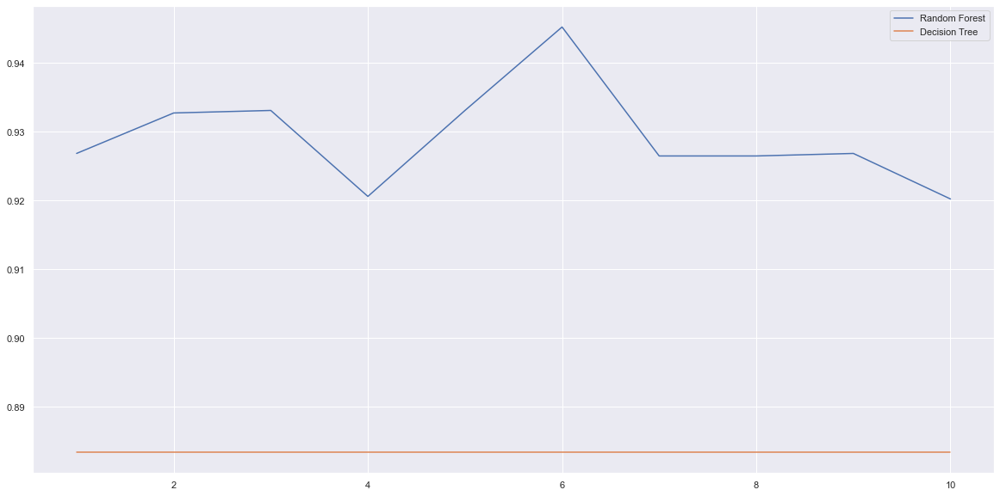

In [ ]:
rfc_l = []
clf_l = []
for i in range(10):
  # rfc = RandomForestClassifier(n_estimators=25)
  rfc_s = cross_val_score(rf_random,X_train,np.ravel(y_train),cv=10).mean()
  rfc_l.append(rfc_s)
  # clf = DecisionTreeClassifier()
  clf_s = cross_val_score(dt,X_train,np.ravel(y_train),cv=10).mean()
  clf_l.append(clf_s)
 
plt.plot(range(1,11),rfc_l,label = "Random Forest")
plt.plot(range(1,11),clf_l,label = "Decision Tree")
plt.legend()
plt.show()

In [ ]:
rf_y_train_pred=rf_random.predict(X_train)
print('Accuracy score of train data :{}'.format(rf_random.score(X_train,y_train)))
print('Train data f1_Score:{}'.format(f1_score(y_train, rf_y_train_pred)))

rf_y_val_pred=rf_random.predict(X_val)
print('Accuracy score of validation  data :{}'.format(rf_random.score(X_val,y_val)))
print('validation data f1_Score:{}'.format(f1_score(y_val, rf_y_val_pred)))

Accuracy score of train data :0.9629629629629629
Train data f1_Score:0.8749999999999999
Accuracy score of validation  data :0.9655172413793104
validation data f1_Score:0.888888888888889


Random forest accuracy increases from 96% to 98% using cross validation score

## Model Explainations

### Permutation Importance
We will run the permutation importance using Decision Tree Classifier

In [84]:
# Evaluate the permutation importance 
perm = PermutationImportance(dt, random_state=101).fit(X_test, y_test) 
# Display the weights of each features     
eli5.show_weights(perm, feature_names = X_test.columns.values)                    

Weight,Feature
0.1125 ± 0.1074,f(458.5020)
0.0667 ± 0.0408,f(226.0000)
0.0625 ± 0.0589,f(1090.5077)
0.0417 ± 0.0527,f(577.6763)
0.0417 ± 0.0000,f(1155.3527)
0.0250 ± 0.0167,f(5993.2283)
0 ± 0.0000,f(2593.6791)
0 ± 0.0000,f(2378.4142)
0 ± 0.0000,f(2310.7054)
0 ± 0.0000,f(7127.1897)


Lets check the same with Random Forest classifier

In [83]:
perm = PermutationImportance(rf_random_model, random_state=101).fit(X_test, y_test)
eli5.show_weights(perm, feature_names = X_test.columns.values)

Weight,Feature
0.0208 ± 0.0000,f(1029.3022)
0.0167 ± 0.0167,f(1155.3527)
0.0125 ± 0.0204,f(1296.8396)
0.0042 ± 0.0167,f(408.4789)
0.0042 ± 0.0167,f(6727.1713)
0 ± 0.0000,f(226.0000)
0 ± 0.0000,f(2593.6791)
0 ± 0.0000,f(2378.4142)
0 ± 0.0000,f(2310.7054)
0 ± 0.0000,f(7127.1897)


Conclusion: The columns in the green are the most important features.

### Shap


#### Lets see how the columns impact a single record of data

In [156]:
row_to_show = 7                               # The row for which we want to check the SHAP explanations
data_to_predict = X_test.iloc[row_to_show]    # data_to_predict

In [157]:
data_to_preddict_array = data_to_predict.values.reshape(1,-1)

rf_random_model.predict_proba(data_to_preddict_array) # Prediction probability on the row of the data


array([[0.93518519, 0.06481481]])

In [158]:
# Predicted output
rf_random_model.predict(data_to_preddict_array)                                       

array([0])

In [159]:
y_test.iloc[row_to_show]

OverallPoF    0
Name: 7, dtype: int64

In [160]:
# Object that can calculate Shap values
explainer_single = shap.TreeExplainer(rf_random_model)                                       # SHAP Tree Explainer

# Calculate the shap values
shap_values_single = explainer_single.shap_values(data_to_predict)                           # SHAP explanations

In [161]:
shap_values_single[0]

array([-2.13727639e-02,  1.59620834e-03, -2.64349864e-02,  1.54162016e-02,
       -4.16186641e-05,  2.98359515e-02, -1.91155694e-03,  1.01739598e-03,
        0.00000000e+00,  2.20458554e-03,  2.26416504e-02, -1.38515831e-02,
        1.46615523e-03,  0.00000000e+00,  5.57322842e-03,  8.90526129e-04,
        2.09090884e-02,  1.30821631e-02,  1.46898797e-02,  1.21358396e-02])

The SHAP model is built on a training data set and the mean of the predictor variables is known by X_train.mean().

In [162]:
X_train.mean()

f(408.4789)     0.157228
f(2593.6791)    0.714201
f(2378.4142)    0.671814
f(2310.7054)    0.642294
f(7127.1897)    0.171181
f(865.5366)     0.438744
f(6727.1713)    0.187232
f(226.0000)     0.059134
f(458.5020)     0.152443
f(500.0000)     0.194293
f(1029.3022)    0.507143
f(5993.2283)    0.264659
f(1887.7486)    0.654320
f(1373.9536)    0.567056
f(667.4199)     0.325357
f(2747.9073)    0.727463
f(1296.8396)    0.560115
f(577.6763)     0.261308
f(1155.3527)    0.537144
f(1090.5077)    0.536943
dtype: float64

In [130]:
y_test.mean()

OverallPoF    0.166667
dtype: float64

The force plot is an interpretation of the predictions for a single sample which visualises shap values as forces, each feature value is a force that increases or decreases the prediction, the prediction starts from a baseline which is the constant of the explanatory model and each attributed value is an arrow that increases (positive) or decreases (negative) the prediction. Features that push the prediction higher (to the right) are shown in red and those that push the prediction lower are shown in blue.

In [163]:
shap.initjs()
shap.force_plot(explainer_single.expected_value[1], shap_values_single[1], data_to_predict)

The data in the eighth row of the predicted output is known to be 0, and the true value is also 0, so the prediction is correct. The figure can be interpreted as the frequency f(2378.4142) having the largest positive contribution, followed by f(408.4789), but f(865.5366) has a large negative contribution, followed by f(1029.3022), meaning that when the values of frequencies such as f(2378.4142), f(408.4789) are lower than their corresponding mean values, and when f( 865.5366), f(1029.3022) and other frequencies are higher than the mean of the training data set, the probability that the sample has an ear with conductive condition is only 0.06.

#### Each feature affects the results

The above are all interpretations for individual instances; the next plots are for all instances.

In [143]:
rf_random.best_estimator_

RandomForestClassifier(max_depth=5, max_features='sqrt', min_samples_leaf=2,
                       min_samples_split=10, n_estimators=16, random_state=42)

In [139]:
rf_random_model

RandomForestClassifier(max_depth=10, min_samples_leaf=2, min_samples_split=10,
                       n_estimators=9, random_state=42)

CPU times: user 2 µs, sys: 0 ns, total: 2 µs
Wall time: 5.96 µs


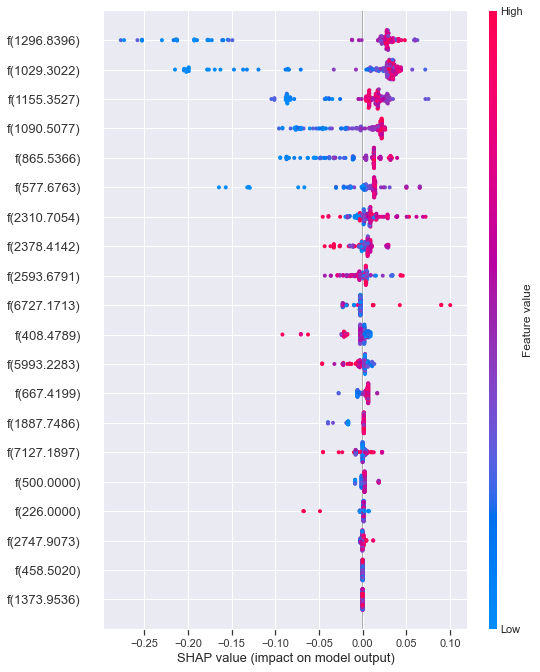

In [155]:
%time
# samples = X_train
samples = X_train

explainer = shap.TreeExplainer(rf_random_model)
shap_values = explainer.shap_values(samples, approximate=False, check_additivity=False)

shap.summary_plot(shap_values[0], samples)

First is the SHAP value plot, which further shows the positive and negative relationship between the predictor variables and the target variables to get the magnitude of the effect of the feature on the prediction, which is equivalent to rotating each feature of the force plot by 90 degrees and drawing it as a point plot. The effect of the size of the feature on the results is indicated by the colour (red for large values, blue for small values and purple adjacent to the mean), the wider the distribution of the area the greater its influence, thus frequencies such as f(1296.8396),f(1029.3022),f(1155.3527) have a high and positive influence, 'high ' from the red and 'negative' influences shown on the x-axis. Similarly we would say that f(2378.4142),f(2593.6791) is positively associated with diagnosing patients ear with conductive condition.

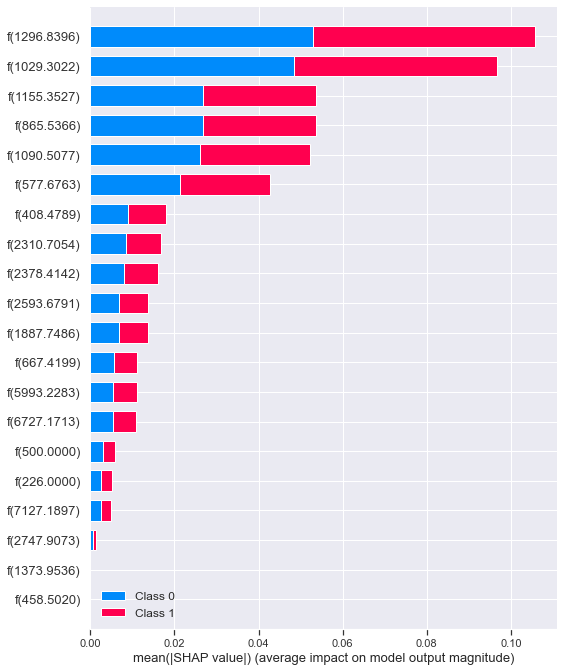

In [137]:
shap.summary_plot(shap_values, X_train)

Based on the SHAP summary plot, we can see top 20 features and their indications of the relationship between the value of a feature and the impact on the classification model. For better understanding let us have a look at the dependence plots.

Based on the SHAP summary plots, we can use them to indicate the top 20 features seen and the relationship between feature values and impact to classify the model. For a better understanding, let's look at the dependency graph.

In [61]:
def make_shap_waterfall_plot(shap_values, features, num_display=20):
    
    '''
    A function for building a SHAP waterfall plot.
    
    SHAP waterfall plot is used to visualize the most important features in a descending order.
    
    Parameters:
    shap_values (list): SHAP values obtained from a model
    features (pandas DataFrame): a list of features used in a model
    num_display(int): number of features to display
    
    Returns:
    matplotlib.pyplot plot: SHAP waterfall plot
    
    '''
    
    column_list = features.columns
    feature_ratio = (np.abs(shap_values).sum(0) / np.abs(shap_values).sum()) * 100
    column_list = column_list[np.argsort(feature_ratio)[::-1]]
    feature_ratio_order = np.sort(feature_ratio)[::-1]
    cum_sum = np.cumsum(feature_ratio_order)
    column_list = column_list[:num_display]
    feature_ratio_order = feature_ratio_order[:num_display]
    cum_sum = cum_sum[:num_display]
    
    num_height = 0
    if (num_display >= 20) & (len(column_list) >= 20):
        num_height = (len(column_list) - 20) * 0.4
        
    fig, ax1 = plt.subplots(figsize=(8, 8 + num_height))
    ax1.plot(cum_sum[::-1], column_list[::-1], c='blue', marker='o')
    ax2 = ax1.twiny()
    ax2.barh(column_list[::-1], feature_ratio_order[::-1], alpha=0.6)
    
    ax1.grid(True)
    ax2.grid(False)
    ax1.set_xticks(np.arange(0, round(cum_sum.max(), -1)+1, 10))
    ax2.set_xticks(np.arange(0, round(feature_ratio_order.max(), -1)+1, 10))
    ax1.set_xlabel('Cumulative Ratio')
    ax2.set_xlabel('Composition Ratio')
    ax1.tick_params(axis="y", labelsize=13)
    plt.ylim(-1, len(column_list))

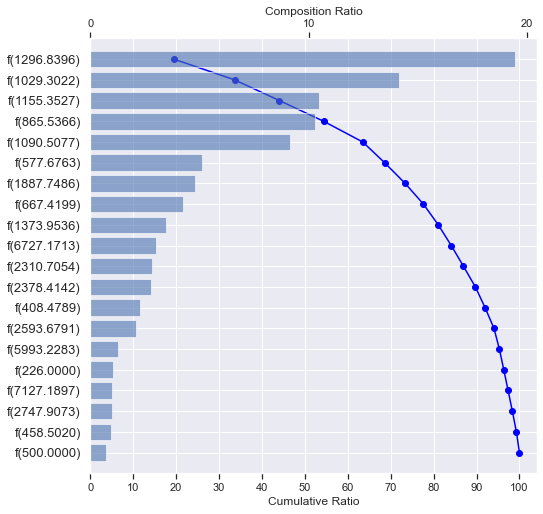

In [148]:
# Shapp waterfall plot
make_shap_waterfall_plot(shap_values[0], samples)

Based on the SHAP waterfall plot, we can say that 'TympType' is the most important feature in the model, which has more than 60% of the model's explainability. Also, these top 27 features provide more than 100% of the model's interpretation

Whether features are positively or negatively correlated, using the force function allows the contribution of features from multiple instances to be plotted on a single graph.

In [164]:
shap.force_plot(explainer.expected_value[1], shap_values[1], samples)


### LIME

In [ ]:
import lime
import lime.lime_tabular

In [ ]:
explainer = lime.lime_tabular.LimeTabularExplainer(X_train.values,
                                                         feature_names=X_train.columns.values.tolist(),
                                                         mode='classification',class_names='Attack')

In [ ]:
lime_expln1=explainer.explain_instance(X_test.iloc[1],dt_model.predict_proba,num_features=X_test.shape[1], top_labels = 1)
lime_expln1.show_in_notebook(show_table=True, show_all=False)


## Prediction Results on Testing Set

In [207]:
# Create a function to generating the prediction results on both the training and test sets
def pred_plot(y_true,y_pred):
    plt.plot(t, y_true, 'r-', linewidth=2, label='true') #t is the abscissa scale
    plt.plot(t, y_pred, 'g-', linewidth=2, label='pred')
    plt.legend(loc = 'lower right')
    plt.grid(visible=True)

The Prediction Results on Testing Set:


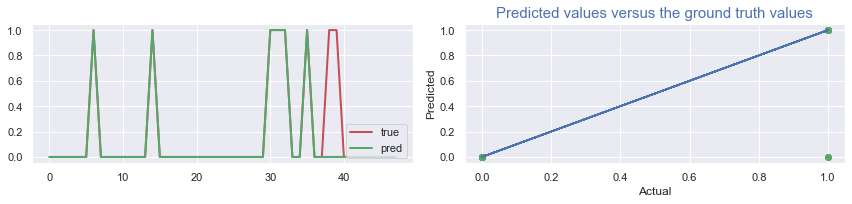

In [ ]:
print("The Prediction Results on Testing Set:") #subtitle
    
fig = plt.figure(figsize=(12,3))

plt.subplot(1,2,1)
t=np.arange(len(X_test))
pred_plot(np.ravel(y_test), np.ravel(y_pred_random)) #call the function on test sets
# plt.title("Test Sets", fontsize=15) #title
fig.tight_layout(pad=1, w_pad=3.0, h_pad=3.0) #adjust the image to the right size and position
# plt.show()

plt.subplot(1,2,2)
# x_diagonal = [0,50]
# y_diagonal = [0,50]
plt.plot(np.ravel(y_test), np.ravel(y_test))
# plt.plot(x_diagonal , y_diagonal , c='0' , linewidth=1 ,  marker='.' , alpha=0.3)# Drawing diagonals
plt.scatter(np.ravel(y_test), np.ravel(y_pred_random),color='g')
plt.xlabel('Actual')
plt.ylabel('Predicted')
plt.title("Predicted values versus the ground truth values",fontsize=15,color='b') #title
    
plt.tight_layout()# Adjusting the distance between each subplot
plt.show()

# Model Fitting - Generative dataset

## Model Choosing 

### Training Model Function

In [64]:
from sklearn.metrics import confusion_matrix, classification_report, roc_auc_score, recall_score
def model_gen_train(model_gen, name):
    model_gen.fit(X_train_gen, y_train_gen)     # Fitting the model_gen
    y_pred_gen = model_gen.predict(X_test_gen)  # Making prediction from the trained model_gen
    cm_gen = confusion_matrix(y_test_gen, y_pred_gen)                               
    print("Grid Search Confusion Matrix " +" Validation Data")          # Displaying the Confusion Matrix
    print(cm_gen)
    print('-----------------------')
    print('-----------------------')
    cr_gen = classification_report(y_test_gen, y_pred_gen)
    print(name +" Classification Report " +" Validation Data")          # Displaying the Classification Report
    print(cr_gen)
    print('------------------------')
    print(name +" AUC Score " +" Validation Data")
    auc_gen = roc_auc_score(y_test_gen, y_pred_gen)       
    print("AUC Score " + str(auc_gen))                                       # Displaying the AUC score
    print(name +" Recall " +" Validation Data")
    rec_gen = recall_score(y_test_gen, y_pred_gen)
    print("Recall "+ str(rec_gen))                                           # Displaying the Recall score
    return auc_gen, rec_gen, model_gen

### Decision Tree

#### before grid search

In [65]:
dt_gen = DecisionTreeClassifier(random_state=42)

In [66]:
dt_auc_gen, dt_rec_gen, dt_model_gen = model_gen_train(dt_gen, "Decision Tree")

Grid Search Confusion Matrix  Validation Data
[[1033   67]
 [  62 1038]]
-----------------------
-----------------------
Decision Tree Classification Report  Validation Data
              precision    recall  f1-score   support

         0.0       0.94      0.94      0.94      1100
         1.0       0.94      0.94      0.94      1100

    accuracy                           0.94      2200
   macro avg       0.94      0.94      0.94      2200
weighted avg       0.94      0.94      0.94      2200

------------------------
Decision Tree AUC Score  Validation Data
AUC Score 0.9413636363636363
Decision Tree Recall  Validation Data
Recall 0.9436363636363636


The metric of our choice should be Recall as we want to minimize FN, which means that an attack accured but the model did not detect it.

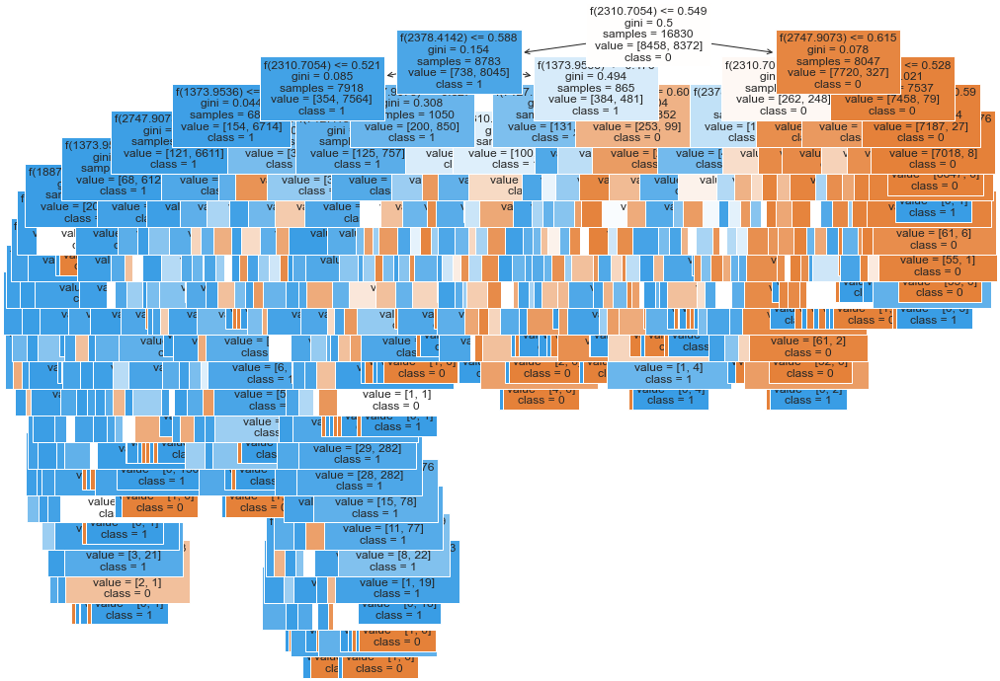

In [67]:
# dtree = DecisionTreeClassifier(criterion='entropy',max_depth=10)
dt_gen.fit(X_train_gen,y_train_gen)
predictions_dt_gen = dt_gen.predict(X_test_gen)
# visualising the decision tree diagram
fig = plt.figure(figsize=(16,12))
a_rf_gen = plot_tree(dt_gen, feature_names=X_train_gen.columns, fontsize=12, filled=True, class_names=['0', '1'])

In [68]:
## train set
dt_gen.fit(X_train_gen,y_train_gen)
dt_gen_prediction_train = dt_gen.predict(X_train_gen)
print("Decision Tree Conclusion for SMOTE Dataset of train set")
print('Precision:         ',precision_score(y_train_gen, dt_gen_prediction_train))
print('F1-Score:          ',f1_score(y_true=y_train_gen, y_pred=dt_gen_prediction_train, average='macro'))
print('Accuracy Scores:   ',accuracy_score(y_true=y_train_gen, y_pred=dt_gen_prediction_train))
print('Recall Scores:     ',recall_score(y_true=y_train_gen,y_pred=dt_gen_prediction_train,average='macro'))
tn, fp, fn, tp = confusion_matrix(y_train_gen, dt_gen_prediction_train).ravel()
sensitivity = tp / (tp+fn)
specificity = tn / (tn+fp)
print('Sensitivity:       ',sensitivity)
print('Specificity:       ',specificity)

Decision Tree Conclusion for SMOTE Dataset of train set
Precision:          1.0
F1-Score:           1.0
Accuracy Scores:    1.0
Recall Scores:      1.0
Sensitivity:        1.0
Specificity:        1.0


In [69]:
## test set
dt_gen.fit(X_train_gen,y_train_gen)
dt_gen_prediction = dt_gen.predict(X_test_gen)
print("Decision Tree Conclusion for SMOTE Dataset of test set")
print('Precision:         ',precision_score(y_test_gen, dt_gen_prediction))
print('F1-Score:          ',f1_score(y_true=y_test_gen, y_pred=dt_gen_prediction, average='macro'))
print('Accuracy Scores:   ',accuracy_score(y_true=y_test_gen, y_pred=dt_gen_prediction))
print('Recall Scores:     ',recall_score(y_true=y_test_gen,y_pred=dt_gen_prediction,average='macro'))
tn, fp, fn, tp = confusion_matrix(y_test_gen, dt_gen_prediction).ravel()
sensitivity = tp / (tp+fn)
specificity = tn / (tn+fp)
print('Sensitivity:       ',sensitivity)
print('Specificity:       ',specificity)

Decision Tree Conclusion for SMOTE Dataset of test set
Precision:          0.9393665158371041
F1-Score:           0.9413633334882928
Accuracy Scores:    0.9413636363636364
Recall Scores:      0.9413636363636364
Sensitivity:        0.9436363636363636
Specificity:        0.9390909090909091


In [70]:
## validation set
y_valpred_dt_gen = dt_gen.predict(X_val_gen)
print("Decision Tree Conclusion for SMOTE Dataset of val set")
print('Precision:         ',precision_score(y_val_gen, y_valpred_dt_gen))
print('F1-Score:          ',f1_score(y_true=y_val_gen, y_pred=y_valpred_dt_gen, average='macro'))
print('Accuracy Scores:   ',accuracy_score(y_true=y_val_gen, y_pred=y_valpred_dt_gen))
print('Recall Scores:     ',recall_score(y_true=y_val_gen,y_pred=y_valpred_dt_gen,average='macro'))
tn, fp, fn, tp = confusion_matrix(y_val_gen, y_valpred_dt_gen).ravel()
sensitivity = tp / (tp+fn)
specificity = tn / (tn+fp)
print('Sensitivity:       ',sensitivity)
print('Specificity:       ',specificity)

Decision Tree Conclusion for SMOTE Dataset of val set
Precision:          0.9579439252336449
F1-Score:           0.9474560670936533
Accuracy Scores:    0.9474747474747475
Recall Scores:      0.9477234026330503
Sensitivity:        0.9391361256544503
Specificity:        0.9563106796116505


<Figure size 1440x720 with 0 Axes>

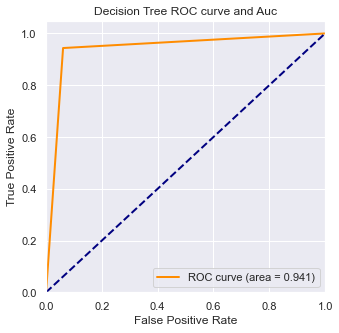

In [71]:
###通过decision_function()计算得到的y_score的值，用在roc_curve()函数中
y_score_dt_gen = dt_gen.fit(X_train_gen, np.ravel(y_train_gen)).predict(X_test_gen)

# Compute ROC curve and ROC area for each class
fpr_dt_gen,tpr_dt_gen,threshold_dt_gen = roc_curve(np.ravel(y_test_gen), y_score_dt_gen) ###计算真正率和假正率
roc_auc_dt_gen = auc(fpr_dt_gen,tpr_dt_gen) ###计算auc的值

plt.figure()
lw = 2
plt.figure(figsize=(5,5))
plt.plot(fpr_dt_gen, tpr_dt_gen, color='darkorange',
         lw=lw, label='ROC curve (area = %0.3f)' % roc_auc_dt_gen) ###假正率为横坐标，真正率为纵坐标做曲线
plt.plot([0, 1], [0, 1], color='navy', lw=lw, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Decision Tree ROC curve and Auc')
plt.legend(loc="lower right")
plt.show()

#### Decision Tree GridSearch

In [74]:
paramGride = dict(
    max_depth = [3,5,6,7,8,10,15,None],
    max_leaf_nodes = [3,5,6,7,8,10,12,15,None])

dtModel_gen = DecisionTreeClassifier()

dt_gen_grid = GridSearchCV(
    dtModel_gen,paramGride,cv = 3,return_train_score = True)
dt_gen_grid = dt_gen_grid.fit(X_train_gen,y_train_gen)

In [75]:
print('best_score:%f'% dt_gen_grid.best_score_)
print('best parameter:')

for key in dt_gen_grid.best_params_.keys():
    print('%s = %s'%(key,dt_gen_grid.best_params_[key]))

best_score:0.953238
best parameter:
max_depth = 6
max_leaf_nodes = None


In [76]:
dt_gen_grid.best_estimator_

DecisionTreeClassifier(max_depth=6)

In [77]:
dt_gen_grid_model = DecisionTreeClassifier(max_depth=6)

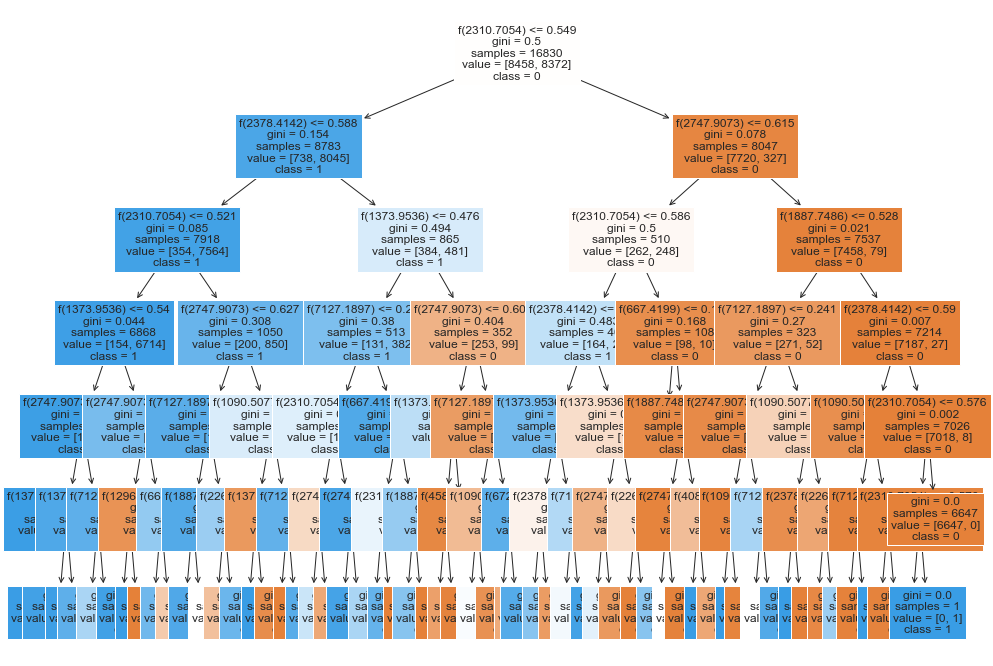

In [78]:
# dtree = DecisionTreeClassifier(criterion='entropy',max_depth=10)
dt_gen_grid_model.fit(X_train_gen,y_train_gen)
predictions_dt_gen_grid = dt_gen_grid_model.predict(X_test_gen)
# visualising the decision tree diagram
fig = plt.figure(figsize=(16,12))
a_rf_gen = plot_tree(dt_gen_grid_model, feature_names=X_train_gen.columns, fontsize=12, filled=True, class_names=['0', '1'])

In [79]:
## train set
dt_gen_grid_model.fit(X_train_gen,y_train_gen)
dt_gen_prediction_train = dt_gen_grid_model.predict(X_train_gen)
print("Decision Tree Conclusion for gen Dataset of train set")
print('Precision:         ',precision_score(y_train_gen, dt_gen_prediction_train))
print('F1-Score:          ',f1_score(y_true=y_train_gen, y_pred=dt_gen_prediction_train, average='macro'))
print('Accuracy Scores:   ',accuracy_score(y_true=y_train_gen, y_pred=dt_gen_prediction_train))
print('Recall Scores:     ',recall_score(y_true=y_train_gen,y_pred=dt_gen_prediction_train,average='macro'))
tn, fp, fn, tp = confusion_matrix(y_train_gen, dt_gen_prediction_train).ravel()
sensitivity = tp / (tp+fn)
specificity = tn / (tn+fp)
print('Sensitivity:       ',sensitivity)
print('Specificity:       ',specificity)

Decision Tree Conclusion for gen Dataset of train set
Precision:          0.947060174552136
F1-Score:           0.9651735394072597
Accuracy Scores:    0.9651812240047534
Recall Scores:      0.9652823337641929
Sensitivity:        0.9850692785475395
Specificity:        0.9454953889808465


In [80]:
## test set
dt_gen_grid_model.fit(X_train_gen,y_train_gen)
dt_gen_prediction = dt_gen_grid_model.predict(X_test_gen)
print("Decision Tree Conclusion for gen Dataset of test set")
print('Precision:         ',precision_score(y_test_gen, dt_gen_prediction))
print('F1-Score:          ',f1_score(y_true=y_test_gen, y_pred=dt_gen_prediction, average='macro'))
print('Accuracy Scores:   ',accuracy_score(y_true=y_test_gen, y_pred=dt_gen_prediction))
print('Recall Scores:     ',recall_score(y_true=y_test_gen,y_pred=dt_gen_prediction,average='macro'))
tn, fp, fn, tp = confusion_matrix(y_test_gen, dt_gen_prediction).ravel()
sensitivity = tp / (tp+fn)
specificity = tn / (tn+fp)
print('Sensitivity:       ',sensitivity)
print('Specificity:       ',specificity)

Decision Tree Conclusion for gen Dataset of test set
Precision:          0.9306409130816505
F1-Score:           0.9458920871621019
Accuracy Scores:    0.9459090909090909
Recall Scores:      0.9459090909090909
Sensitivity:        0.9636363636363636
Specificity:        0.9281818181818182


In [81]:
## validation set
y_valpred_dt_gen = dt_gen_grid_model.predict(X_val_gen)
print("Decision Tree Conclusion for gen Dataset of val set")
print('Precision:         ',precision_score(y_val_gen, y_valpred_dt_gen))
print('F1-Score:          ',f1_score(y_true=y_val_gen, y_pred=y_valpred_dt_gen, average='macro'))
print('Accuracy Scores:   ',accuracy_score(y_true=y_val_gen, y_pred=y_valpred_dt_gen))
print('Recall Scores:     ',recall_score(y_true=y_val_gen,y_pred=y_valpred_dt_gen,average='macro'))
tn, fp, fn, tp = confusion_matrix(y_val_gen, y_valpred_dt_gen).ravel()
sensitivity = tp / (tp+fn)
specificity = tn / (tn+fp)
print('Sensitivity:       ',sensitivity)
print('Specificity:       ',specificity)

Decision Tree Conclusion for gen Dataset of val set
Precision:          0.9476038338658147
F1-Score:           0.9571655906109755
Accuracy Scores:    0.9572390572390572
Recall Scores:      0.9568421367937202
Sensitivity:        0.9705497382198953
Specificity:        0.9431345353675451


<Figure size 1440x720 with 0 Axes>

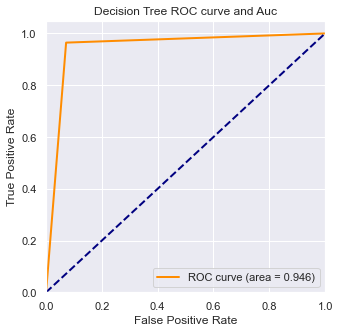

In [82]:
###通过decision_function()计算得到的y_score的值，用在roc_curve()函数中
y_score_dt_gen = dt_gen_grid_model.fit(X_train_gen, np.ravel(y_train_gen)).predict(X_test_gen)

# Compute ROC curve and ROC area for each class
fpr_dt_gen,tpr_dt_gen,threshold_dt_gen = roc_curve(np.ravel(y_test_gen), y_score_dt_gen) ###计算真正率和假正率
roc_auc_dt_gen = auc(fpr_dt_gen,tpr_dt_gen) ###计算auc的值

plt.figure()
lw = 2
plt.figure(figsize=(5,5))
plt.plot(fpr_dt_gen, tpr_dt_gen, color='darkorange',
         lw=lw, label='ROC curve (area = %0.3f)' % roc_auc_dt_gen) ###假正率为横坐标，真正率为纵坐标做曲线
plt.plot([0, 1], [0, 1], color='navy', lw=lw, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Decision Tree ROC curve and Auc')
plt.legend(loc="lower right")
plt.show()

### Random Forest

In [87]:
rf_gen = RandomForestClassifier(random_state=42)

In [88]:
rf_auc_gen, rf_rec_gen, rf_model_gen = model_gen_train(rf_gen, "Random Forest Classifier")

Grid Search Confusion Matrix  Validation Data
[[1043   57]
 [  23 1077]]
-----------------------
-----------------------
Random Forest Classifier Classification Report  Validation Data
              precision    recall  f1-score   support

         0.0       0.98      0.95      0.96      1100
         1.0       0.95      0.98      0.96      1100

    accuracy                           0.96      2200
   macro avg       0.96      0.96      0.96      2200
weighted avg       0.96      0.96      0.96      2200

------------------------
Random Forest Classifier AUC Score  Validation Data
AUC Score 0.9636363636363636
Random Forest Classifier Recall  Validation Data
Recall 0.9790909090909091


In [89]:
## train set
rf_gen.fit(X_train_gen,y_train_gen)
rf_gen_prediction_train = rf_gen.predict(X_train_gen)
print("Random Forest Conclusion for Generative Dataset of train set")
print('Precision:         ',precision_score(y_train_gen, rf_gen_prediction_train))
print('F1-Score:          ',f1_score(y_true=y_train_gen, y_pred=rf_gen_prediction_train, average='macro'))
print('Accuracy Scores:   ',accuracy_score(y_true=y_train_gen, y_pred=rf_gen_prediction_train))
print('Recall Scores:     ',recall_score(y_true=y_train_gen,y_pred=rf_gen_prediction_train,average='macro'))
tn, fp, fn, tp = confusion_matrix(y_train_gen, rf_gen_prediction_train).ravel()
sensitivity = tp / (tp+fn)
specificity = tn / (tn+fp)
print('Sensitivity:       ',sensitivity)
print('Specificity:       ',specificity)

Random Forest Conclusion for Generative Dataset of train set
Precision:          1.0
F1-Score:           1.0
Accuracy Scores:    1.0
Recall Scores:      1.0
Sensitivity:        1.0
Specificity:        1.0


In [90]:
## test set
rf_gen.fit(X_train_gen,y_train_gen)
rf_gen_prediction = rf_gen.predict(X_test_gen)
print("Random Forest Conclusion for Generative Dataset of test set")
print('Precision:         ',precision_score(y_test_gen, rf_gen_prediction))
print('F1-Score:          ',f1_score(y_true=y_test_gen, y_pred=rf_gen_prediction, average='macro'))
print('Accuracy Scores:   ',accuracy_score(y_true=y_test_gen, y_pred=rf_gen_prediction))
print('Recall Scores:     ',recall_score(y_true=y_test_gen,y_pred=rf_gen_prediction,average='macro'))
tn, fp, fn, tp = confusion_matrix(y_test_gen, rf_gen_prediction).ravel()
sensitivity = tp / (tp+fn)
specificity = tn / (tn+fp)
print('Sensitivity:       ',sensitivity)
print('Specificity:       ',specificity)

Random Forest Conclusion for Generative Dataset of test set
Precision:          0.9497354497354498
F1-Score:           0.9636276763623708
Accuracy Scores:    0.9636363636363636
Recall Scores:      0.9636363636363636
Sensitivity:        0.9790909090909091
Specificity:        0.9481818181818182


In [91]:
## validation set
y_valpred_gen = rf_gen.predict(X_val_gen)
print("Random Forest Conclusion for Generative Dataset of val set")
print('Precision:         ',precision_score(y_val_gen, y_valpred_gen))
print('F1-Score:          ',f1_score(y_true=y_val_gen, y_pred=y_valpred_gen, average='macro'))
print('Accuracy Scores:   ',accuracy_score(y_true=y_val_gen, y_pred=y_valpred_gen))
print('Recall Scores:     ',recall_score(y_true=y_val_gen,y_pred=y_valpred_gen,average='macro'))
tn, fp, fn, tp = confusion_matrix(y_val_gen, y_valpred_gen).ravel()
sensitivity = tp / (tp+fn)
specificity = tn / (tn+fp)
print('Sensitivity:       ',sensitivity)
print('Specificity:       ',specificity)

Random Forest Conclusion for Generative Dataset of val set
Precision:          0.9646074646074646
F1-Score:           0.9716768940764883
Accuracy Scores:    0.9717171717171718
Recall Scores:      0.9714397361140359
Sensitivity:        0.981020942408377
Specificity:        0.9618585298196949


<Figure size 1440x720 with 0 Axes>

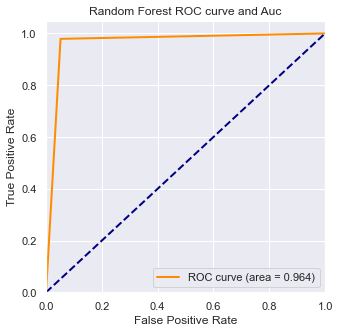

In [92]:
y_score_rf_gen = rf_gen.fit(X_train_gen, np.ravel(y_train_gen)).predict(X_test_gen)

# Compute ROC curve and ROC area for each class
fpr_rf_gen,tpr_rf_gen,threshold_rf_gen = roc_curve(np.ravel(y_test_gen), y_score_rf_gen) 
roc_auc_rf_gen = auc(fpr_rf_gen,tpr_rf_gen)

plt.figure()
lw = 2
plt.figure(figsize=(5,5))
plt.plot(fpr_rf_gen, tpr_rf_gen, color='darkorange',
         lw=lw, label='ROC curve (area = %0.3f)' % roc_auc_rf_gen)
plt.plot([0, 1], [0, 1], color='navy', lw=lw, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Random Forest ROC curve and Auc')
plt.legend(loc="lower right")
plt.show()

### Scores for Train and Validation data

In [93]:
rf_y_train_pred_gen=rf_gen.predict(X_train_gen)
print('Accuracy score of train data :{}'.format(rf_gen.score(X_train_gen,y_train_gen)))
print('Train data f1_Score:{}'.format(f1_score(y_train_gen, rf_y_train_pred_gen)))

rf_y_val_pred_gen=rf_gen.predict(X_val_gen)
print('Accuracy score of validation  data :{}'.format(rf_gen.score(X_val_gen,y_val_gen)))
print('validation data f1_Score:{}'.format(f1_score(y_val_gen, rf_y_val_pred_gen)))

Accuracy score of train data :1.0
Train data f1_Score:1.0
Accuracy score of validation  data :0.9717171717171718
validation data f1_Score:0.972744970798183


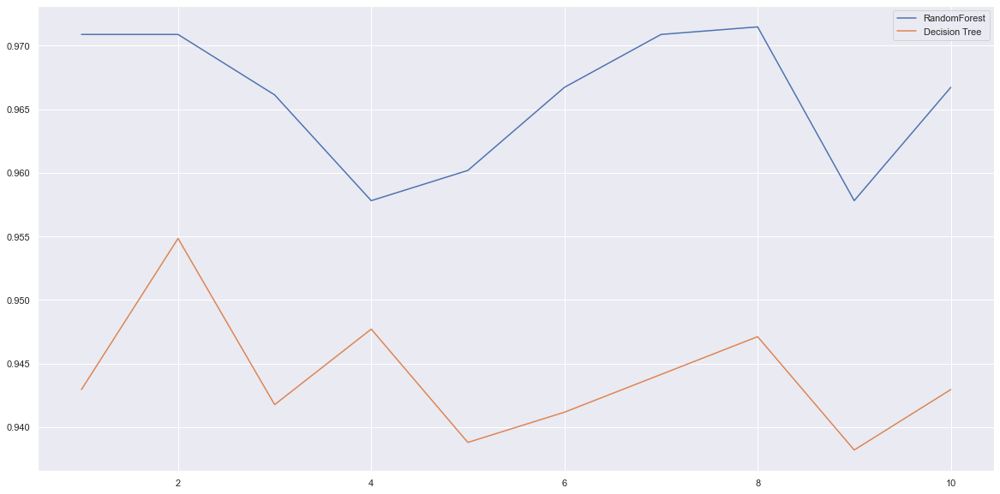

In [94]:
#随机森林
# rfc=RandomForestClassifier(n_estimators=25)
rfc_s_gen=cross_val_score(rf_gen,X_train_gen,np.ravel(y_train_gen),cv=10)
#决策树
# clf=DecisionTreeClassifier(random_state=0)
clf_s_gen=cross_val_score(dt_gen,X_train_gen,np.ravel(y_train_gen),cv=10)
#绘制十折交叉验证
plt.plot(range(1,11),rfc_s_gen,label="RandomForest")
plt.plot(range(1,11),clf_s_gen,label="Decision Tree")
plt.legend()
plt.show()

随机森林和决策树在十组交叉验证下的效果对比

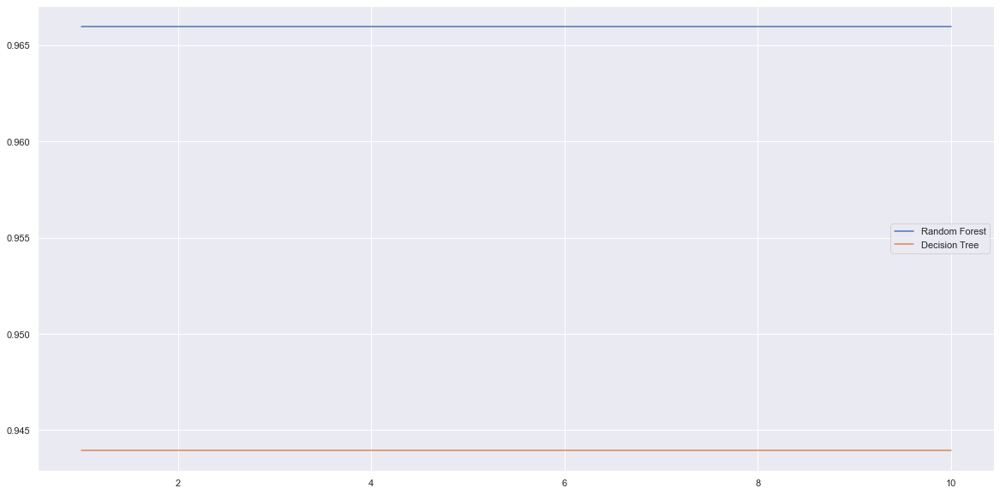

In [95]:
rfc_l_gen = []
clf_l_gen = []
for i in range(10):
  # rfc = RandomForestClassifier(n_estimators=25)
  rfc_s_gen = cross_val_score(rf_gen,X_train_gen,np.ravel(y_train_gen),cv=10).mean()
  rfc_l_gen.append(rfc_s_gen)
  # clf = DecisionTreeClassifier()
  clf_s_gen = cross_val_score(dt_gen,X_train_gen,np.ravel(y_train_gen),cv=10).mean()
  clf_l_gen.append(clf_s_gen)
 
plt.plot(range(1,11),rfc_l_gen,label = "Random Forest")
plt.plot(range(1,11),clf_l_gen,label = "Decision Tree")
plt.legend()
plt.show()

### Grid Search

In [97]:
random_grid = {'n_estimators': range(5,20),
              'max_features' : ['auto', 'sqrt'],
              'max_depth' : [5,6,7,8,10,15],
              'min_samples_split':[2,5,10],
              'min_samples_leaf':[1,2,4]}

rf_gs_gen = GridSearchCV(rf_gen, random_grid, cv = 3, n_jobs=-1, verbose=2)

rf_gs_gen.fit(X_train_gen, np.ravel(y_train_gen))
y_pred_gen = rf_gs_gen.predict(X_test_gen)

Fitting 3 folds for each of 1620 candidates, totalling 4860 fits
[CV] END max_depth=5, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=5; total time=   0.3s
[CV] END max_depth=5, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=5; total time=   0.3s
[CV] END max_depth=5, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=5; total time=   0.3s
[CV] END max_depth=5, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=6; total time=   0.3s
[CV] END max_depth=5, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=6; total time=   0.4s
[CV] END max_depth=5, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=6; total time=   0.3s
[CV] END max_depth=5, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=7; total time=   0.3s
[CV] END max_depth=5, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=7; total time=   0.4s

In [98]:
rf_gs_gen.best_estimator_

RandomForestClassifier(max_depth=15, min_samples_leaf=2, n_estimators=19,
                       random_state=42)

In [99]:
rf_gs_gen_model=RandomForestClassifier(max_depth=15, min_samples_leaf=2, n_estimators=19,
                       random_state=42)
rf_gs_gen_model.fit(X_train_gen, np.ravel(y_train_gen))
y_pred_gs_gen = rf_gs_gen_model.predict(X_test_gen)

In [100]:
print("Grid Search Validation Data")
cm_gen = confusion_matrix(y_test_gen, y_pred_gs_gen)                               
print("Grid Search Confusion Matrix " +" Validation Data")                # Displaying the Confusion Matrix
print(cm_gen)
print('-----------------------')
cr_gen = classification_report(y_test_gen, y_pred_gs_gen)
print("Grid Search Classification Report " +" Validation Data")           # Displaying the Classification Report
print(cr_gen)
print('------------------------')
print("Grid Search AUC Score " +" Validation Data")
auc_gen = roc_auc_score(y_test_gen, y_pred_gs_gen)       
print("AUC Score " + str(auc_gen))                                       # Displaying the AUC score
print("Grid Search Recall " +" Validation Data")
rec_gen = recall_score(y_test_gen, y_pred_gs_gen)
print("Recall "+ str(rec_gen))                                           # Displaying the Recall score

Grid Search Validation Data
Grid Search Confusion Matrix  Validation Data
[[1040   60]
 [  24 1076]]
-----------------------
Grid Search Classification Report  Validation Data
              precision    recall  f1-score   support

         0.0       0.98      0.95      0.96      1100
         1.0       0.95      0.98      0.96      1100

    accuracy                           0.96      2200
   macro avg       0.96      0.96      0.96      2200
weighted avg       0.96      0.96      0.96      2200

------------------------
Grid Search AUC Score  Validation Data
AUC Score 0.9618181818181817
Grid Search Recall  Validation Data
Recall 0.9781818181818182


In [101]:
## train set
rf_gs_gen_model.fit(X_train_gen,y_train_gen)
y_pred_gs_gen_train = rf_gs_gen_model.predict(X_train_gen)
print("Random Forest Conclusion for SMOTE Dataset of train set")
print('Precision:         ',precision_score(y_train_gen, y_pred_gs_gen_train))
print('F1-Score:          ',f1_score(y_true=y_train_gen, y_pred=y_pred_gs_gen_train, average='macro'))
print('Accuracy Scores:   ',accuracy_score(y_true=y_train_gen, y_pred=y_pred_gs_gen_train))
print('Recall Scores:     ',recall_score(y_true=y_train_gen,y_pred=y_pred_gs_gen_train,average='macro'))
tn, fp, fn, tp = confusion_matrix(y_train_gen, y_pred_gs_gen_train).ravel()
sensitivity = tp / (tp+fn)
specificity = tn / (tn+fp)
print('Sensitivity:       ',sensitivity)
print('Specificity:       ',specificity)

Random Forest Conclusion for SMOTE Dataset of train set
Precision:          0.9899336807200378
F1-Score:           0.9941770607359954
Accuracy Scores:    0.9941770647653001
Recall Scores:      0.9941987739197995
Sensitivity:        0.9984472049689441
Specificity:        0.989950342870655


In [102]:
## test set
y_pred_gs_gen = rf_gs_gen_model.predict(X_test_gen)
print("Random Forest Conclusion for Original Dataset of test set")
print('Precision:         ',precision_score(y_test_gen, y_pred_gs_gen))
print('F1-Score:          ',f1_score(y_true=y_test_gen, y_pred=y_pred_gs_gen, average='macro'))
print('Accuracy Scores:   ',accuracy_score(y_true=y_test_gen, y_pred=y_pred_gs_gen))
print('Recall Scores:     ',recall_score(y_true=y_test_gen,y_pred=y_pred_gs_gen,average='macro'))
tn, fp, fn, tp = confusion_matrix(y_test_gen, y_pred_gs_gen).ravel()
sensitivity = tp / (tp+fn)
specificity = tn / (tn+fp)
print('Sensitivity:       ',sensitivity)
print('Specificity:       ',specificity)

Random Forest Conclusion for Original Dataset of test set
Precision:          0.9471830985915493
F1-Score:           0.9618079551880007
Accuracy Scores:    0.9618181818181818
Recall Scores:      0.9618181818181818
Sensitivity:        0.9781818181818182
Specificity:        0.9454545454545454


In [103]:
## validation set
y_valpred_gs_gen = rf_gs_gen_model.predict(X_val_gen)
print("Random Forest Conclusion for Original Dataset of val set")
print('Precision:         ',precision_score(y_val_gen, y_valpred_gs_gen))
print('F1-Score:          ',f1_score(y_true=y_val_gen, y_pred=y_valpred_gs_gen, average='macro'))
print('Accuracy Scores:   ',accuracy_score(y_true=y_val_gen, y_pred=y_valpred_gs_gen))
print('Recall Scores:     ',recall_score(y_true=y_val_gen,y_pred=y_valpred_gs_gen,average='macro'))
tn, fp, fn, tp = confusion_matrix(y_val_gen, y_valpred_gs_gen).ravel()
sensitivity = tp / (tp+fn)
specificity = tn / (tn+fp)
print('Sensitivity:       ',sensitivity)
print('Specificity:       ',specificity)

Random Forest Conclusion for Original Dataset of val set
Precision:          0.963777490297542
F1-Score:           0.9683113123552511
Accuracy Scores:    0.9683501683501684
Recall Scores:      0.9681479692980226
Sensitivity:        0.975130890052356
Specificity:        0.9611650485436893


<Figure size 1440x720 with 0 Axes>

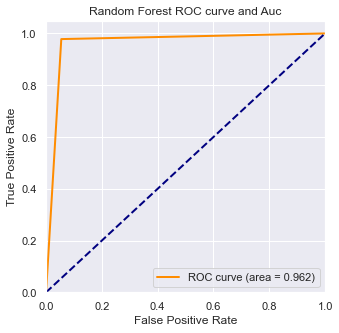

In [104]:
###通过decision_function()计算得到的y_score的值，用在roc_curve()函数中
y_score_rf_gs_gen = rf_gs_gen_model.fit(X_train_gen, np.ravel(y_train_gen)).predict(X_test_gen)

# Compute ROC curve and ROC area for each class
fpr_rf_gs_gen,tpr_rf_gs_gen,threshold_rf_gs_gen = roc_curve(np.ravel(y_test_gen), y_score_rf_gs_gen) ###计算真正率和假正率
roc_auc_rf_gs_gen = auc(fpr_rf_gs_gen,tpr_rf_gs_gen) ###计算auc的值

plt.figure()
lw = 2
plt.figure(figsize=(5,5))
plt.plot(fpr_rf_gs_gen, tpr_rf_gs_gen, color='darkorange',
         lw=lw, label='ROC curve (area = %0.3f)' % roc_auc_rf_gs_gen) ###假正率为横坐标，真正率为纵坐标做曲线
plt.plot([0, 1], [0, 1], color='navy', lw=lw, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Random Forest ROC curve and Auc')
plt.legend(loc="lower right")
plt.show()

### Randomized Grid Search

In [119]:
rf_random_gen = RandomizedSearchCV(rf_gen, random_grid, cv = 3, n_jobs=-1, verbose=2)

rf_random_gen.fit(X_train_gen, np.ravel(y_train_gen))
y_pred_gen = rf_random_gen.predict(X_test_gen)

Fitting 3 folds for each of 10 candidates, totalling 30 fits
[CV] END max_depth=6, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, n_estimators=9; total time=   0.5s
[CV] END max_depth=6, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, n_estimators=9; total time=   0.5s
[CV] END max_depth=6, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, n_estimators=9; total time=   0.5s
[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, n_estimators=9; total time=   0.7s
[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, n_estimators=9; total time=   0.7s
[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, n_estimators=9; total time=   0.7s
[CV] END max_depth=10, max_features=auto, min_samples_leaf=4, min_samples_split=5, n_estimators=16; total time=   1.2s
[CV] END max_depth=10, max_features=auto, min_samples_leaf=4, min_samples_split=5, n_estimators=16; total tim

In [120]:
rf_random_gen.best_estimator_

RandomForestClassifier(max_depth=15, min_samples_leaf=2, n_estimators=18,
                       random_state=42)

In [121]:
rf_random_gen_model = RandomForestClassifier(max_depth=15, min_samples_leaf=2, n_estimators=18,
                       random_state=42)
rf_random_gen_model.fit(X_train_gen, np.ravel(y_train_gen))
y_pred_random_gen = rf_random_gen_model.predict(X_test_gen)

In [123]:
print("Randomized Grid Search Validation Data")
cm_gen = confusion_matrix(y_test_gen, y_pred_random_gen)                               
print("Randomized Grid Search Confusion Matrix " +" Validation Data")                # Displaying the Confusion Matrix
print(cm_gen)
print('-----------------------')
cr_gen = classification_report(y_test_gen, y_pred_random_gen)
print("Randomized Grid Search Classification Report " +" Validation Data")           # Displaying the Classification Report
print(cr_gen)
print('------------------------')
print("Randomized Grid Search AUC Score " +" Validation Data")
auc_gen = roc_auc_score(y_test_gen, y_pred_random_gen)       
print("AUC Score " + str(auc_gen))                                       # Displaying the AUC score
print("Randomized Grid Search Recall " +" Validation Data")
rec_gen = recall_score(y_test_gen, y_pred_random_gen)
print("Recall "+ str(rec_gen))                                           # Displaying the Recall score

Randomized Grid Search Validation Data
Randomized Grid Search Confusion Matrix  Validation Data
[[1042   58]
 [  24 1076]]
-----------------------
Randomized Grid Search Classification Report  Validation Data
              precision    recall  f1-score   support

         0.0       0.98      0.95      0.96      1100
         1.0       0.95      0.98      0.96      1100

    accuracy                           0.96      2200
   macro avg       0.96      0.96      0.96      2200
weighted avg       0.96      0.96      0.96      2200

------------------------
Randomized Grid Search AUC Score  Validation Data
AUC Score 0.9627272727272727
Randomized Grid Search Recall  Validation Data
Recall 0.9781818181818182


In [124]:
## train set
rf_random_gen_model.fit(X_train_gen,y_train_gen)
y_pred_random_gen_train = rf_random_gen_model.predict(X_train_gen)
print("Random Forest Conclusion for SMOTE Dataset of train set")
print('Precision:         ',precision_score(y_train_gen, y_pred_random_gen_train))
print('F1-Score:          ',f1_score(y_true=y_train_gen, y_pred=y_pred_random_gen_train, average='macro'))
print('Accuracy Scores:   ',accuracy_score(y_true=y_train_gen, y_pred=y_pred_random_gen_train))
print('Recall Scores:     ',recall_score(y_true=y_train_gen,y_pred=y_pred_random_gen_train,average='macro'))
tn, fp, fn, tp = confusion_matrix(y_train_gen, y_pred_random_gen_train).ravel()
sensitivity = tp / (tp+fn)
specificity = tn / (tn+fp)
print('Sensitivity:       ',sensitivity)
print('Specificity:       ',specificity)

Random Forest Conclusion for SMOTE Dataset of train set
Precision:          0.989579632918887
F1-Score:           0.9938799725814129
Accuracy Scores:    0.9938799762329175
Recall Scores:      0.9939019812576619
Sensitivity:        0.9982083134257047
Specificity:        0.9895956490896193


In [125]:
## test set
y_pred_random_gen = rf_random_gen_model.predict(X_test_gen)
print("Random Forest Conclusion for SMOTE Dataset of test set")
print('Precision:         ',precision_score(y_test_gen, y_pred_random_gen))
print('F1-Score:          ',f1_score(y_true=y_test_gen, y_pred=y_pred_random_gen, average='macro'))
print('Accuracy Scores:   ',accuracy_score(y_true=y_test_gen, y_pred=y_pred_random_gen))
print('Recall Scores:     ',recall_score(y_true=y_test_gen,y_pred=y_pred_random_gen,average='macro'))
tn, fp, fn, tp = confusion_matrix(y_test_gen, y_pred_random_gen).ravel()
sensitivity = tp / (tp+fn)
specificity = tn / (tn+fp)
print('Sensitivity:       ',sensitivity)
print('Specificity:       ',specificity)

Random Forest Conclusion for SMOTE Dataset of test set
Precision:          0.9488536155202821
F1-Score:           0.9627183682714301
Accuracy Scores:    0.9627272727272728
Recall Scores:      0.9627272727272727
Sensitivity:        0.9781818181818182
Specificity:        0.9472727272727273


In [126]:
## validation set
y_valpred_random_gen = rf_random_gen_model.predict(X_val_gen)
print("Random Forest Conclusion for SMOTE Dataset of val set")
print('Precision:         ',precision_score(y_val_gen, y_valpred_random_gen))
print('F1-Score:          ',f1_score(y_true=y_val_gen, y_pred=y_valpred_random_gen, average='macro'))
print('Accuracy Scores:   ',accuracy_score(y_true=y_val_gen, y_pred=y_valpred_random_gen))
print('Recall Scores:     ',recall_score(y_true=y_val_gen,y_pred=y_valpred_random_gen,average='macro'))
tn, fp, fn, tp = confusion_matrix(y_val_gen, y_valpred_random_gen).ravel()
sensitivity = tp / (tp+fn)
specificity = tn / (tn+fp)
print('Sensitivity:       ',sensitivity)
print('Specificity:       ',specificity)

Random Forest Conclusion for SMOTE Dataset of val set
Precision:          0.962532299741602
F1-Score:           0.9676355420592657
Accuracy Scores:    0.9676767676767677
Recall Scores:      0.9674544880220171
Sensitivity:        0.975130890052356
Specificity:        0.9597780859916782


<Figure size 1440x720 with 0 Axes>

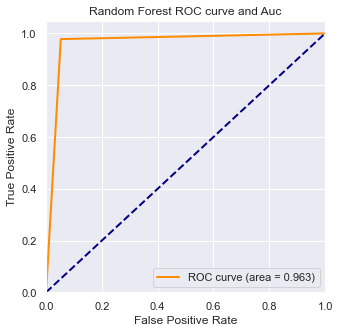

In [127]:
y_score_rf_random_gen = rf_random_gen_model.fit(X_train_gen, np.ravel(y_train_gen)).predict(X_test_gen)

# Compute ROC curve and ROC area for each class
fpr_rf_random_gen,tpr_rf_random_gen,threshold_rf_random_gen = roc_curve(np.ravel(y_test_gen), y_score_rf_random_gen) 
roc_auc_rf_random_gen = auc(fpr_rf_random_gen,tpr_rf_random_gen) 
plt.figure()
lw = 2
plt.figure(figsize=(5,5))
plt.plot(fpr_rf_random_gen, tpr_rf_random_gen, color='darkorange',
         lw=lw, label='ROC curve (area = %0.3f)' % roc_auc_rf_random_gen) 
plt.plot([0, 1], [0, 1], color='navy', lw=lw, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Random Forest ROC curve and Auc')
plt.legend(loc="lower right")
plt.show()

## Model Explainations

### Permutation Importance
We will run the permutation importance using Decision Tree Classifier

In [128]:
# Evaluate the permutation importance
perm_gen = PermutationImportance(dt_gen, random_state=42).fit(X_test_gen, y_test_gen)    
# Display the weights of each features   
eli5.show_weights(perm_gen, feature_names = X_test_gen.columns.values)

Weight,Feature
0.1483 ± 0.0121,f(2310.7054)
0.1075 ± 0.0119,f(2747.9073)
0.0769 ± 0.0125,f(7127.1897)
0.0622 ± 0.0025,f(1887.7486)
0.0300 ± 0.0024,f(226.0000)
0.0291 ± 0.0070,f(6727.1713)
0.0286 ± 0.0048,f(1373.9536)
0.0154 ± 0.0036,f(1090.5077)
0.0132 ± 0.0099,f(2378.4142)
0.0127 ± 0.0038,f(577.6763)


Lets check the same with Random Forest classifier

In [129]:
perm_gen = PermutationImportance(rf_gs_gen_model, random_state=101).fit(X_test_gen, y_test_gen)
eli5.show_weights(perm_gen, feature_names = X_test_gen.columns.values)

Weight,Feature
0.0105 ± 0.0040,f(2747.9073)
0.0094 ± 0.0080,f(2310.7054)
0.0084 ± 0.0037,f(2378.4142)
0.0059 ± 0.0033,f(1090.5077)
0.0058 ± 0.0057,f(1373.9536)
0.0039 ± 0.0043,f(226.0000)
0.0038 ± 0.0035,f(7127.1897)
0.0038 ± 0.0027,f(6727.1713)
0.0018 ± 0.0026,f(1155.3527)
0.0015 ± 0.0032,f(1887.7486)


Conclusion: The columns in the green are the most important features.

### Shap
Lets see how the columns impact a single record of data

In [130]:
# The row for which we want to check the SHAP explanations
row_to_show = 20        
# data_to_predict
data_to_predict_gen = X_test_gen.iloc[row_to_show]

In [131]:
data_to_preddict_array_gen = data_to_predict_gen.values.reshape(1,-1)

rf_gs_gen_model.predict_proba(data_to_preddict_array_gen) # Prediction probability on the row of the data


array([[0., 1.]])

In [132]:
rf_gs_gen_model.predict(data_to_preddict_array_gen)       # Predicted output

array([1.])

In [133]:
y_test_gen.iloc[row_to_show]

OverallPoF    1.0
Name: 20, dtype: float64

In [134]:
# Object that can calculate Shap values
explainer_gen = shap.TreeExplainer(rf_gs_gen_model)  # SHAP Tree Explainer

# Calculate the shap values
shap_values_gen = explainer_gen.shap_values(data_to_predict_gen) # SHAP explanations

The force plot is an interpretation of the predictions for a single sample which visualises shap values as forces, each feature value is a force that increases or decreases the prediction, the prediction starts from a baseline which is the constant of the explanatory model and each attributed value is an arrow that increases (positive) or decreases (negative) the prediction. Features that push the prediction higher (to the right) are shown in red and those that push the prediction lower are shown in blue.

In [135]:
shap.initjs()
shap.force_plot(explainer_gen.expected_value[1], shap_values_gen[1], data_to_predict_gen)

The predicted output is known to be 0, and the true value is also 0, so the prediction is correct. The predicted value of the model is 0.06 close to 0, which can be interpreted by the figure as only the frequency f(408.4789) makes a positive contribution to the result, with f(577.6763) making a large negative contribution, followed by f(1296.8396), meaning that when the value of f(408.4789) is lower than their corresponding mean, and f(577.6763), f(1296.8396), etc. have frequencies above the mean of the training data set, the probability of that sample having an ear with conductive condition is 0.00.

#### Each feature affects the results

The above are all interpretations for individual instances; the next plots are for all instances.

CPU times: user 3 µs, sys: 1 µs, total: 4 µs
Wall time: 7.15 µs


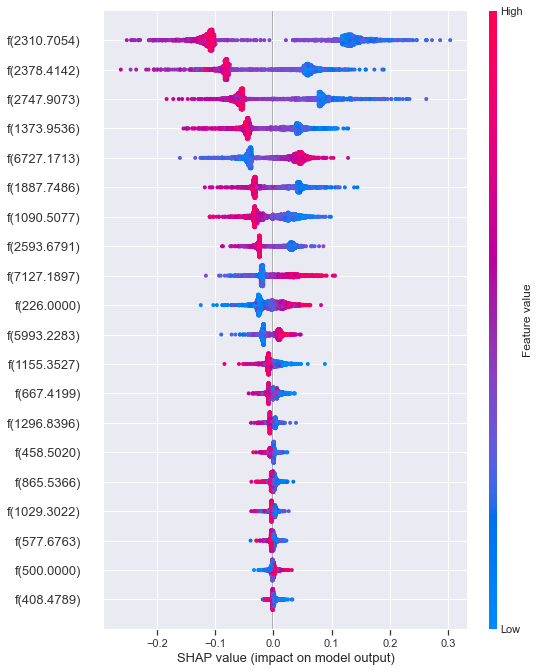

In [136]:
%time
# samples = X_train
samples_gen = X_test_gen

explainer_gen = shap.TreeExplainer(rf_gs_gen_model)
shap_values_gen = explainer_gen.shap_values(samples_gen, approximate=False, check_additivity=False)

shap.summary_plot(shap_values_gen[1], samples_gen)

First is the SHAP value plot, which further shows the positive and negative relationship between the predictor variables and the target variables to get the magnitude of the effect of the feature on the prediction, which is equivalent to rotating each feature of the force plot by 90 degrees and drawing it as a point plot. The effect of the size of the feature on the results is indicated by the colour (red for large values, blue for small values and purple adjacent to the mean), the wider the distribution of the area the greater its influence, thus frequencies such as f(1029.3022),f(1296.8396),f(1090.5077) have a high and positive influence, 'high ' from the red and 'negative' influences shown on the x-axis. Similarly we would say that f(2378.4142),f(226.0000),f(408.4789) is positively associated with diagnosing patients ear with conductive condition.

Based on the SHAP summary plot, we can see top 20 features and their indications of the relationship between the value of a feature and the impact on the classification model. For better understanding let us have a look at the dependence plots.

For a better understanding, let's look at the dependency diagram:

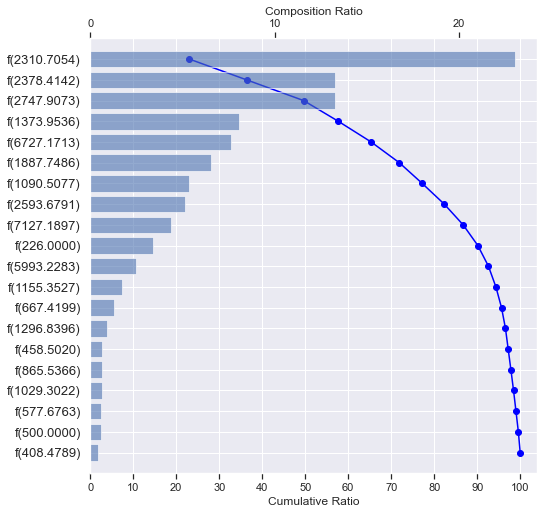

In [137]:
# Shapp waterfall plot
make_shap_waterfall_plot(shap_values_gen[1], samples_gen)

Based on the SHAP waterfall plot, we can say that f(1029.3022) and f(1296.8396) are two most important frequencies in the model, both of them almost reach 15% of the model's explainability. Also, these top 20 frequencies have provided 100% of the model's interpretation.

特征是正相关还是负相关，使用force函数可将多个实例的特征贡献度画在一张图上。

In [138]:
shap.force_plot(explainer_gen.expected_value[1], shap_values_gen[1], samples_gen)

Based on the SHAP waterfall plot, we can say that f(1090.5077) and f(1029.3022) are two most important frequencies in the model, both of them almost reach 20% of the model's explainability. Also, these top 20 frequencies have provided 100% of the model's interpretation.

### LIME

In [ ]:
import lime
import lime.lime_tabular

In [ ]:
# explainer_smote = lime.lime_tabular.LimeTabularExplainer(X_train_smote.values,
#                                                          feature_names=X_train_smote.columns.values.tolist(),
#                                                          mode='classification',class_names='Attack')

In [ ]:
# lime_expln1_smote=explainer_smote.explain_instance(X_test_smote.iloc[1],dt_model_smote.predict_proba,num_features=X_test_smote.shape[1], top_labels = 1)
# lime_expln1_smote.show_in_notebook(show_table=True, show_all=False)


## Prediction Results on Testing Set

The Prediction Results on Testing Set:


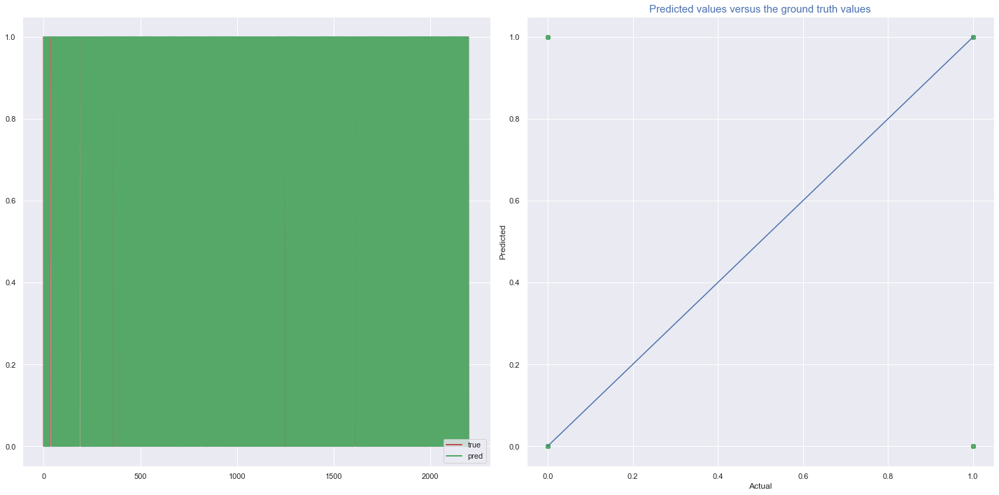

In [142]:
print("The Prediction Results on Testing Set:") #subtitle
    
fig = plt.figure(figsize=(20,10))

plt.subplot(1,2,1)
t=np.arange(len(X_test_gen))
pred_plot(np.ravel(y_test_gen), np.ravel(y_pred_gs_gen)) #call the function on test sets
# plt.title("Test Sets", fontsize=15) #title
fig.tight_layout(pad=1, w_pad=3.0, h_pad=3.0) #adjust the image to the right size and position
# plt.show()

plt.subplot(1,2,2)
# x_diagonal = [0,50]
# y_diagonal = [0,50]
plt.plot(np.ravel(y_test_gen), np.ravel(y_test_gen))
# plt.plot(x_diagonal , y_diagonal , c='0' , linewidth=1 ,  marker='.' , alpha=0.3)# Drawing diagonals
plt.scatter(np.ravel(y_test_gen), np.ravel(y_pred_gs_gen),color='g')
plt.xlabel('Actual')
plt.ylabel('Predicted')
plt.title("Predicted values versus the ground truth values",fontsize=15,color='b') #title
    
plt.tight_layout()# Adjusting the distance between each subplot
plt.show()

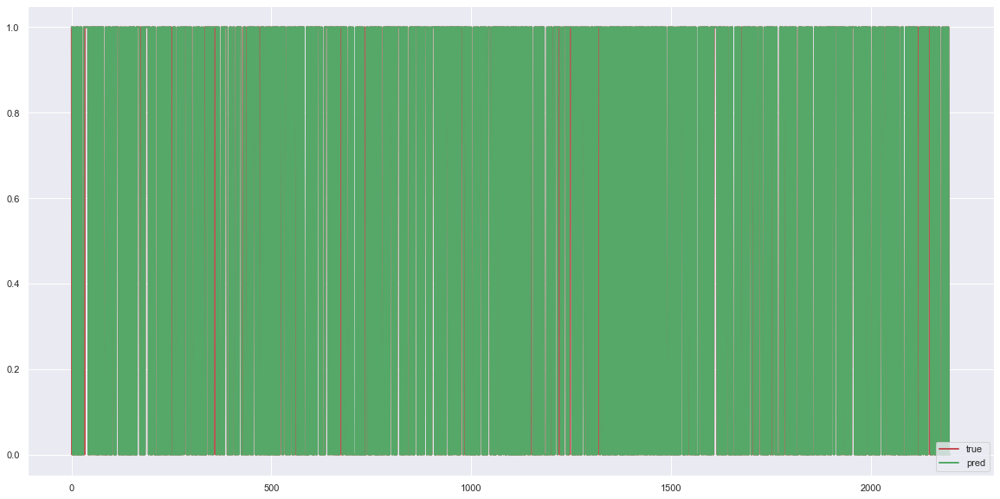

In [143]:
t=np.arange(len(X_test_gen))
pred_plot(np.ravel(y_test_gen), np.ravel(y_pred_gs_gen)) #call the function on test sets
# plt.title("Test Sets", fontsize=15) #title
fig.tight_layout(pad=1, w_pad=3.0, h_pad=3.0) #adjust the image to the right size and position

# Test on each data sets

## Generative Data

### Decision Tree

In [178]:
# dt_gen_grid_model
dt_gen_grid_model.fit(X_train_gen, y_train_gen)

print("############### Test on Generative Data ###############")

# Train set
print("Training Data")
y_train_pred_dt_gen = dt_gen_grid_model.predict(X_train_gen)
print(classification_report(y_train_pred_dt_gen, y_train_gen))

# Test set
print("Test Data")
y_test_pred_dt_gen = dt_gen_grid_model.predict(X_test_gen)
print(classification_report(y_test_pred_dt_gen, y_test_gen))

# Validation set
print("Validation Data")
y_val_pred_dt_gen = dt_gen_grid_model.predict(X_val_gen)
print(classification_report(y_val_pred_dt_gen, y_val_gen))

print("############### ####################### ###############")

############### Test on Generative Data ###############
Training Data
              precision    recall  f1-score   support

         0.0       0.95      0.98      0.96      8122
         1.0       0.99      0.95      0.97      8708

    accuracy                           0.97     16830
   macro avg       0.97      0.97      0.97     16830
weighted avg       0.97      0.97      0.97     16830

Test Data
              precision    recall  f1-score   support

         0.0       0.93      0.96      0.95      1060
         1.0       0.96      0.93      0.95      1140

    accuracy                           0.95      2200
   macro avg       0.95      0.95      0.95      2200
weighted avg       0.95      0.95      0.95      2200

Validation Data
              precision    recall  f1-score   support

         0.0       0.94      0.97      0.96      1405
         1.0       0.97      0.95      0.96      1565

    accuracy                           0.96      2970
   macro avg       0.96      0.9

### Random Forest

In [177]:
# rf_random_gen_model
rf_random_gen_model.fit(X_train_gen, y_train_gen)

print("############### Test on Generative Data ###############")

# Train set
print("Training Data")
y_train_pred_rf_gen = rf_random_gen_model.predict(X_train_gen)
print(classification_report(y_train_pred_rf_gen, y_train_gen))

# Test set
print("Test Data")
y_test_pred_rf_gen = rf_random_gen_model.predict(X_test_gen)
print(classification_report(y_test_pred_rf_gen, y_test_gen))

# Validation set
print("Validation Data")
y_val_pred_rf_gen = rf_random_gen_model.predict(X_val_gen)
print(classification_report(y_val_pred_rf_gen, y_val_gen))
print("############### ####################### ###############")

############### Test on Generative Data ###############
Training Data
              precision    recall  f1-score   support

         0.0       0.99      1.00      0.99      8385
         1.0       1.00      0.99      0.99      8445

    accuracy                           0.99     16830
   macro avg       0.99      0.99      0.99     16830
weighted avg       0.99      0.99      0.99     16830

Test Data
              precision    recall  f1-score   support

         0.0       0.95      0.98      0.96      1066
         1.0       0.98      0.95      0.96      1134

    accuracy                           0.96      2200
   macro avg       0.96      0.96      0.96      2200
weighted avg       0.96      0.96      0.96      2200

Validation Data
              precision    recall  f1-score   support

         0.0       0.96      0.97      0.97      1422
         1.0       0.98      0.96      0.97      1548

    accuracy                           0.97      2970
   macro avg       0.97      0.9

## Original Data

### Decision Tree

In [186]:
# dt_gen_grid_model
dt_gen_grid_model.fit(X_train_gen, y_train_gen)

print("################# Test on Nomal Data #################")

# Train set
print("Training Data")
y_train_pred_dt_norm = dt_gen_grid_model.predict(X_train)
print(classification_report(y_train_pred_dt_norm, y_train))

# Test set
print("Test Data")
y_test_pred_dt_norm = dt_gen_grid_model.predict(X_test)
print(classification_report(y_test_pred_dt_norm, y_test))

# Validation set
print("Validation Data")
y_val_pred_dt_norm = dt_gen_grid_model.predict(X_val)
print(classification_report(y_val_pred_dt_norm, y_val))

print("############### ####################### ###############")

################# Test on Nomal Data #################
Training Data
              precision    recall  f1-score   support

         0.0       0.76      0.92      0.83       113
         1.0       0.64      0.33      0.43        49

    accuracy                           0.74       162
   macro avg       0.70      0.62      0.63       162
weighted avg       0.72      0.74      0.71       162

Test Data
              precision    recall  f1-score   support

         0.0       0.82      0.92      0.87        36
         1.0       0.62      0.42      0.50        12

    accuracy                           0.79        48
   macro avg       0.72      0.67      0.68        48
weighted avg       0.78      0.79      0.78        48

Validation Data
              precision    recall  f1-score   support

         0.0       0.83      0.91      0.87        22
         1.0       0.60      0.43      0.50         7

    accuracy                           0.79        29
   macro avg       0.72      0.67

### Random Forest

In [187]:
# rf_random_gen_model
rf_random_gen_model.fit(X_train_gen, y_train_gen)

print("################# Test on Normal Data #################")

# Train set
print("Training Data")
y_train_pred_rf_norm = rf_random_gen_model.predict(X_train)
print(classification_report(y_train_pred_rf_norm, y_train))

# Test set
print("Test Data")
y_test_pred_rf_norm = rf_random_gen_model.predict(X_test)
print(classification_report(y_test_pred_rf_norm, y_test))

# Validation set
print("Validation Data")
y_val_pred_rf_norm = rf_random_gen_model.predict(X_val)
print(classification_report(y_val_pred_rf_norm, y_val))

print("############### ####################### ###############")

################# Test on Normal Data #################
Training Data
              precision    recall  f1-score   support

         0.0       0.82      0.92      0.86       122
         1.0       0.60      0.38      0.46        40

    accuracy                           0.78       162
   macro avg       0.71      0.65      0.66       162
weighted avg       0.76      0.78      0.77       162

Test Data
              precision    recall  f1-score   support

         0.0       0.88      0.90      0.89        39
         1.0       0.50      0.44      0.47         9

    accuracy                           0.81        48
   macro avg       0.69      0.67      0.68        48
weighted avg       0.80      0.81      0.81        48

Validation Data
              precision    recall  f1-score   support

         0.0       0.83      0.87      0.85        23
         1.0       0.40      0.33      0.36         6

    accuracy                           0.76        29
   macro avg       0.62      0.6

## Oversampled Data

### Decision Tree

In [179]:
# dt_gen_grid_model
dt_gen_grid_model.fit(X_train_gen, y_train_gen)

print("############### Test on Oversampled Data ###############")

# Train set
print("Training Data")
y_train_pred_dt_over = dt_gen_grid_model.predict(X_train_over_large)
print(classification_report(y_train_pred_dt_over, y_train_over_large))

# Test set
print("Test Data")
y_test_pred_dt_over = dt_gen_grid_model.predict(X_test_over_large)
print(classification_report(y_test_pred_dt_over, y_test_over_large))

# Validation set
print("Validation Data")
y_val_pred_dt_over = dt_gen_grid_model.predict(X_val_over_large)
print(classification_report(y_val_pred_dt_over, y_val_over_large))

print("############### ####################### ###############")

############### Test on Oversampled Data ###############
Training Data
              precision    recall  f1-score   support

         0.0       0.79      0.69      0.74      4176
         1.0       0.64      0.75      0.69      3049

    accuracy                           0.71      7225
   macro avg       0.71      0.72      0.71      7225
weighted avg       0.73      0.71      0.72      7225

Test Data
              precision    recall  f1-score   support

         0.0       0.79      0.69      0.74       855
         1.0       0.65      0.76      0.70       645

    accuracy                           0.72      1500
   macro avg       0.72      0.73      0.72      1500
weighted avg       0.73      0.72      0.72      1500

Validation Data
              precision    recall  f1-score   support

         0.0       0.78      0.66      0.72       729
         1.0       0.63      0.75      0.68       546

    accuracy                           0.70      1275
   macro avg       0.70      0.

### Random Forest

In [180]:
# rf_random_gen_model
rf_random_gen_model.fit(X_train_gen, y_train_gen)

print("############### Test on Oversampled Data ###############")

# Train set
print("Training Data")
y_train_pred_rf_over = rf_random_gen_model.predict(X_train_over_large)
print(classification_report(y_train_pred_rf_over, y_train_over_large))

# Test set
print("Test Data")
y_test_pred_rf_over = rf_random_gen_model.predict(X_test_over_large)
print(classification_report(y_test_pred_rf_over, y_test_over_large))

# Validation set
print("Validation Data")
y_val_pred_rf_over = rf_random_gen_model.predict(X_val_over_large)
print(classification_report(y_val_pred_rf_over, y_val_over_large))

print("############### ####################### ###############")

############### Test on Oversampled Data ###############
Training Data
              precision    recall  f1-score   support

         0.0       0.83      0.65      0.73      4617
         1.0       0.56      0.77      0.65      2608

    accuracy                           0.70      7225
   macro avg       0.70      0.71      0.69      7225
weighted avg       0.73      0.70      0.70      7225

Test Data
              precision    recall  f1-score   support

         0.0       0.83      0.66      0.74       939
         1.0       0.58      0.78      0.66       561

    accuracy                           0.71      1500
   macro avg       0.71      0.72      0.70      1500
weighted avg       0.74      0.71      0.71      1500

Validation Data
              precision    recall  f1-score   support

         0.0       0.83      0.64      0.72       800
         1.0       0.56      0.77      0.65       475

    accuracy                           0.69      1275
   macro avg       0.69      0.

## SMOTE Data

### Decision Tree

In [182]:
# dt_gen_grid_model
dt_gen_grid_model.fit(X_train_gen, y_train_gen)

print("################# Test on SMOTE Data #################")

# Train set
print("Training Data")
y_train_pred_dt_smote = dt_gen_grid_model.predict(X_train_smote_large)
print(classification_report(y_train_pred_dt_smote, y_train_smote_large))

# Test set
print("Test Data")
y_test_pred_dt_smote = dt_gen_grid_model.predict(X_test_smote_large)
print(classification_report(y_test_pred_dt_smote, y_test_smote_large))

# Validation set
print("Validation Data")
y_val_pred_dt_smote = dt_gen_grid_model.predict(X_val_smote_large)
print(classification_report(y_val_pred_dt_smote, y_val_smote_large))

print("############### ####################### ###############")

################# Test on SMOTE Data #################
Training Data
              precision    recall  f1-score   support

         0.0       0.85      0.73      0.78      4214
         1.0       0.68      0.82      0.74      3011

    accuracy                           0.77      7225
   macro avg       0.77      0.77      0.76      7225
weighted avg       0.78      0.77      0.77      7225

Test Data
              precision    recall  f1-score   support

         0.0       0.85      0.71      0.77       898
         1.0       0.65      0.81      0.72       602

    accuracy                           0.75      1500
   macro avg       0.75      0.76      0.74      1500
weighted avg       0.77      0.75      0.75      1500

Validation Data
              precision    recall  f1-score   support

         0.0       0.85      0.68      0.76       770
         1.0       0.63      0.81      0.71       505

    accuracy                           0.74      1275
   macro avg       0.74      0.75

### Random Forest

In [183]:
# rf_random_gen_model
rf_random_gen_model.fit(X_train_gen, y_train_gen)

print("################# Test on SMOTE Data #################")

# Train set
print("Training Data")
y_train_pred_rf_smote = rf_random_gen_model.predict(X_train_smote_large)
print(classification_report(y_train_pred_rf_smote, y_train_smote_large))

# Test set
print("Test Data")
y_test_pred_rf_smote = rf_random_gen_model.predict(X_test_smote_large)
print(classification_report(y_test_pred_rf_smote, y_test_smote_large))

# Validation set
print("Validation Data")
y_val_pred_rf_smote = rf_random_gen_model.predict(X_val_smote_large)
print(classification_report(y_val_pred_rf_smote, y_val_smote_large))

print("############### ####################### ###############")

################# Test on SMOTE Data #################
Training Data
              precision    recall  f1-score   support

         0.0       0.88      0.69      0.77      4679
         1.0       0.59      0.84      0.69      2546

    accuracy                           0.74      7225
   macro avg       0.74      0.76      0.73      7225
weighted avg       0.78      0.74      0.74      7225

Test Data
              precision    recall  f1-score   support

         0.0       0.88      0.67      0.76       988
         1.0       0.56      0.83      0.67       512

    accuracy                           0.72      1500
   macro avg       0.72      0.75      0.72      1500
weighted avg       0.77      0.72      0.73      1500

Validation Data
              precision    recall  f1-score   support

         0.0       0.90      0.67      0.77       827
         1.0       0.59      0.86      0.70       448

    accuracy                           0.74      1275
   macro avg       0.74      0.77

## ADASYN Data

### Decision Tree

In [ ]:
# dt_gen_grid_model
dt_gen_grid_model.fit(X_train_gen, y_train_gen)

print("################# Test on ADASYN Data #################")

# Train set
print("Training Data")
y_train_pred_dt_adasyn = dt_gen_grid_model.predict(X_train_adasyn_large)
print(classification_report(y_train_pred_dt_adasyn, y_train_adasyn_large))

# Test set
print("Test Data")
y_test_pred_dt_adasyn = dt_gen_grid_model.predict(X_test_adasyn_large)
print(classification_report(y_test_pred_dt_adasyn, y_test_adasyn_large))

# Validation set
print("Validation Data")
y_val_pred_dt_adasyn = dt_gen_grid_model.predict(X_val_adasyn_large)
print(classification_report(y_val_pred_dt_adasyn, y_val_adasyn_large))

print("############### ####################### ###############")

################# Test on ADASYN Data #################
Training Data
              precision    recall  f1-score   support

         0.0       0.67      0.59      0.63      4124
         1.0       0.53      0.62      0.57      3102

    accuracy                           0.60      7226
   macro avg       0.60      0.61      0.60      7226
weighted avg       0.61      0.60      0.61      7226

Test Data
              precision    recall  f1-score   support

         0.0       0.69      0.60      0.64       857
         1.0       0.54      0.64      0.59       644

    accuracy                           0.62      1501
   macro avg       0.62      0.62      0.61      1501
weighted avg       0.63      0.62      0.62      1501

Validation Data
              precision    recall  f1-score   support

         0.0       0.71      0.62      0.66       731
         1.0       0.57      0.67      0.61       545

    accuracy                           0.64      1276
   macro avg       0.64      0.6

### Random Forest

In [ ]:
# rf_random_gen_model
rf_random_gen_model.fit(X_train_gen, y_train_gen)

print("################# Test on ADASYN Data #################")

# Train set
print("Training Data")
y_train_pred_rf_adasyn = rf_random_gen_model.predict(X_train_adasyn_large)
print(classification_report(y_train_pred_rf_adasyn, y_train_adasyn_large))

# Test set
print("Test Data")
y_test_pred_rf_adasyn = rf_random_gen_model.predict(X_test_adasyn_large)
print(classification_report(y_test_pred_rf_adasyn, y_test_adasyn_large))

# Validation set
print("Validation Data")
y_val_pred_rf_adasyn = rf_random_gen_model.predict(X_val_adasyn_large)
print(classification_report(y_val_pred_rf_adasyn, y_val_adasyn_large))

print("############### ####################### ###############")

################# Test on ADASYN Data #################
Training Data
              precision    recall  f1-score   support

         0.0       0.74      0.58      0.65      4660
         1.0       0.45      0.64      0.53      2566

    accuracy                           0.60      7226
   macro avg       0.60      0.61      0.59      7226
weighted avg       0.64      0.60      0.61      7226

Test Data
              precision    recall  f1-score   support

         0.0       0.74      0.57      0.65       967
         1.0       0.45      0.63      0.53       534

    accuracy                           0.60      1501
   macro avg       0.60      0.60      0.59      1501
weighted avg       0.64      0.60      0.60      1501

Validation Data
              precision    recall  f1-score   support

         0.0       0.78      0.59      0.67       826
         1.0       0.48      0.69      0.56       450

    accuracy                           0.63      1276
   macro avg       0.63      0.6